**1. Upload the Dataset**

In [ ]:
from google.colab import files
uploaded = files.upload()

Saving Telco_customer_churn.xlsx to Telco_customer_churn (1).xlsx


**2. Get an overview of how the data looks like**

In [ ]:
import pandas as pd
df = pd.read_excel('Telco_customer_churn.xlsx')
df.head()

,CustomerID,Count,Country,State,City,Zip Code,Lat Long,Latitude,Longitude,Gender,...,Contract,Paperless Billing,Payment Method,Monthly Charges,Total Charges,Churn Label,Churn Value,Churn Score,CLTV,Churn Reason
0,3668-QPYBK,1,United States,California,Los Angeles,90003,"33.964131, -118.272783",33.964131,-118.272783,Male,...,Month-to-month,Yes,Mailed check,53.85,108.15,Yes,1,86,3239,Competitor made better offer
1,9237-HQITU,1,United States,California,Los Angeles,90005,"34.059281, -118.30742",34.059281,-118.307420,Female,...,Month-to-month,Yes,Electronic check,70.70,151.65,Yes,1,67,2701,Moved
2,9305-CDSKC,1,United States,California,Los Angeles,90006,"34.048013, -118.293953",34.048013,-118.293953,Female,...,Month-to-month,Yes,Electronic check,99.65,820.5,Yes,1,86,5372,Moved
3,7892-POOKP,1,United States,California,Los Angeles,90010,"34.062125, -118.315709",34.062125,-118.315709,Female,...,Month-to-month,Yes,Electronic check,104.80,3046.05,Yes,1,84,5003,Moved
4,0280-XJGEX,1,United States,California,Los Angeles,90015,"34.039224, -118.266293",34.039224,-118.266293,Male,...,Month-to-month,Yes,Bank transfer (automatic),103.70,5036.3,Yes,1,89,5340,Competitor had better devices


**3. Perform Exploratory Data Analysis**

*Step 1: Identify the numerical and categorical columns*

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
numerical_columns = df.select_dtypes(include=['int', 'float']).columns.tolist() #identify numerical columns and convert them to list
categorical_columns = df.select_dtypes(include=['object']).columns.tolist() #identify categorical columns and convert them to list
print(numerical_columns)
print(categorical_columns)

['Count', 'Zip Code', 'Latitude', 'Longitude', 'Tenure Months', 'Monthly Charges', 'Churn Value', 'Churn Score', 'CLTV']
['CustomerID', 'Country', 'State', 'City', 'Lat Long', 'Gender', 'Senior Citizen', 'Partner', 'Dependents', 'Phone Service', 'Multiple Lines', 'Internet Service', 'Online Security', 'Online Backup', 'Device Protection', 'Tech Support', 'Streaming TV', 'Streaming Movies', 'Contract', 'Paperless Billing', 'Payment Method', 'Total Charges', 'Churn Label', 'Churn Reason']


*Step 2: Convert categorical columns to boolean for better visualization*

In [ ]:
for col in numerical_columns:
  if df[col].dtype == 'bool':
    df[col]=df[col].astype(str)

*Step 3: Plot Histogram for numerical features*

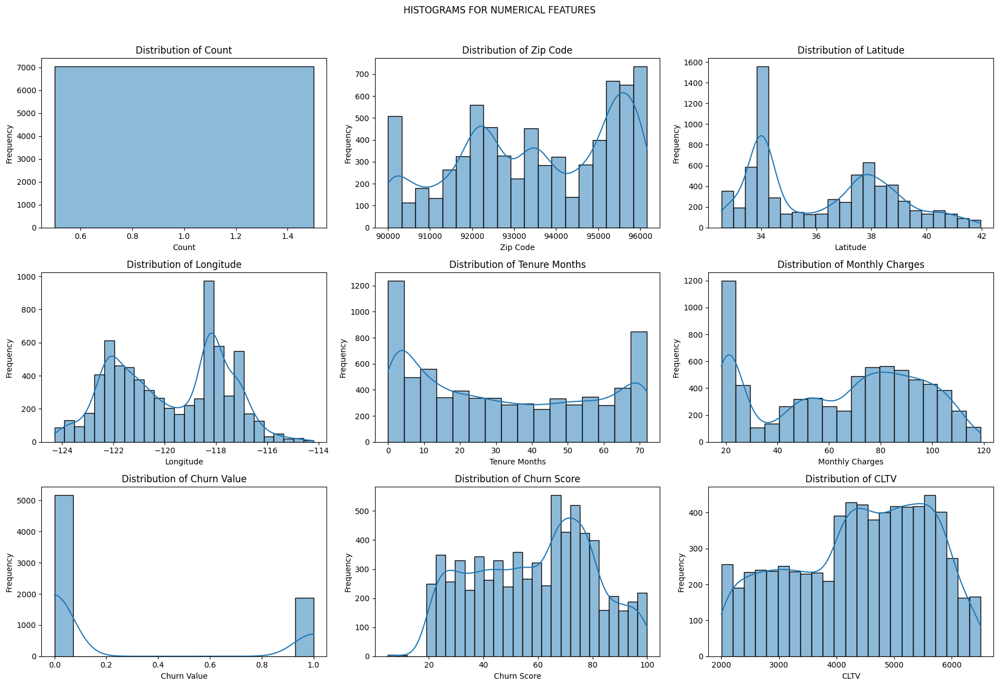

In [ ]:
plt.figure(figsize=(18, 12))
for i, col in enumerate(numerical_columns):
    plt.subplot(3, 3, i + 1)
    sns.histplot(df[col], kde=True)
    plt.title(f'Distribution of {col}')
    plt.suptitle('HISTOGRAMS FOR NUMERICAL FEATURES', y=1.02)
    plt.xlabel(col)
    plt.ylabel('Frequency')
plt.tight_layout()
plt.show()

*Step 4: Plot countplot for categorical features*

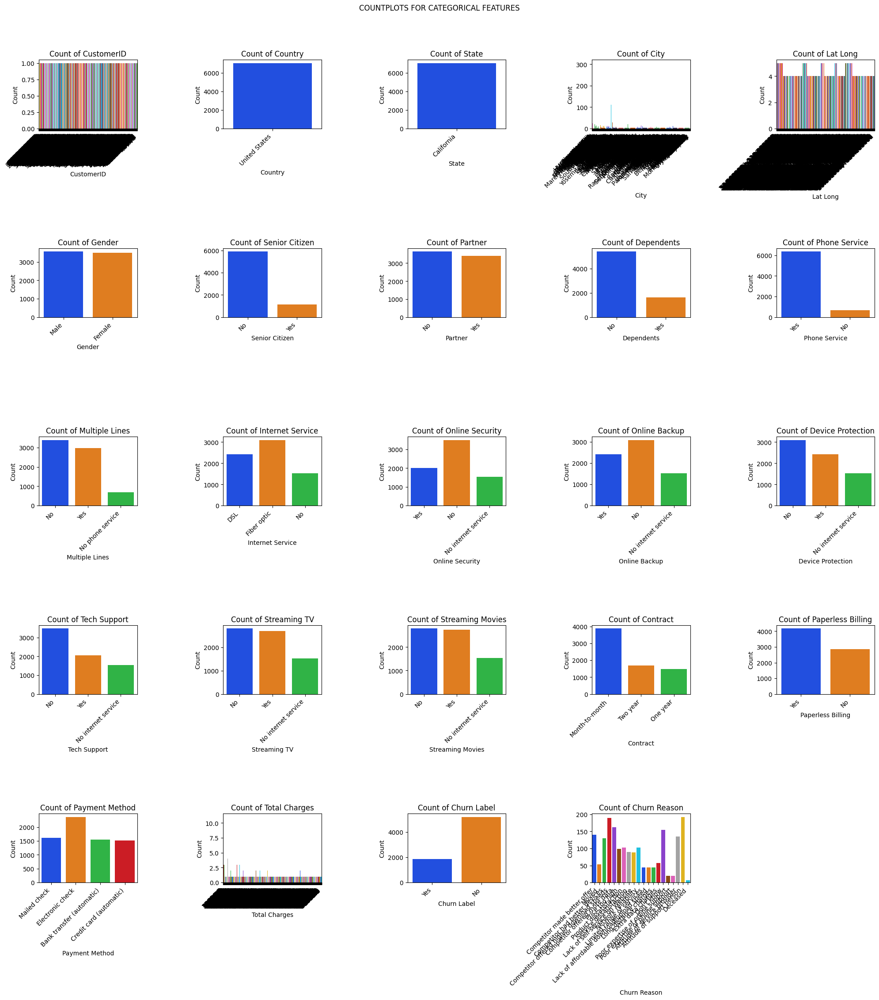

In [ ]:
plt.figure(figsize=(20, 28))
for i, col in enumerate(categorical_columns):
    plt.subplot(7, 5, i + 1)
    sns.countplot(data=df, x=col, hue=col, palette='bright', legend=False)
    plt.title(f'Count of {col}')
    plt.suptitle('COUNTPLOTS FOR CATEGORICAL FEATURES', y=1.02)
    plt.xlabel(col)
    plt.ylabel('Count')
    plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

*Step 5: Exclude Churn Label because want to analyze the inter-relationships among the predictor features, not the relationship of a feature with itself or the relationship between the target variable and itself*

In [ ]:
if 'Churn Label' in numerical_columns:
    numerical_columns.remove('Churn Label')

*Step 6: Plot pairplots for numerical features*

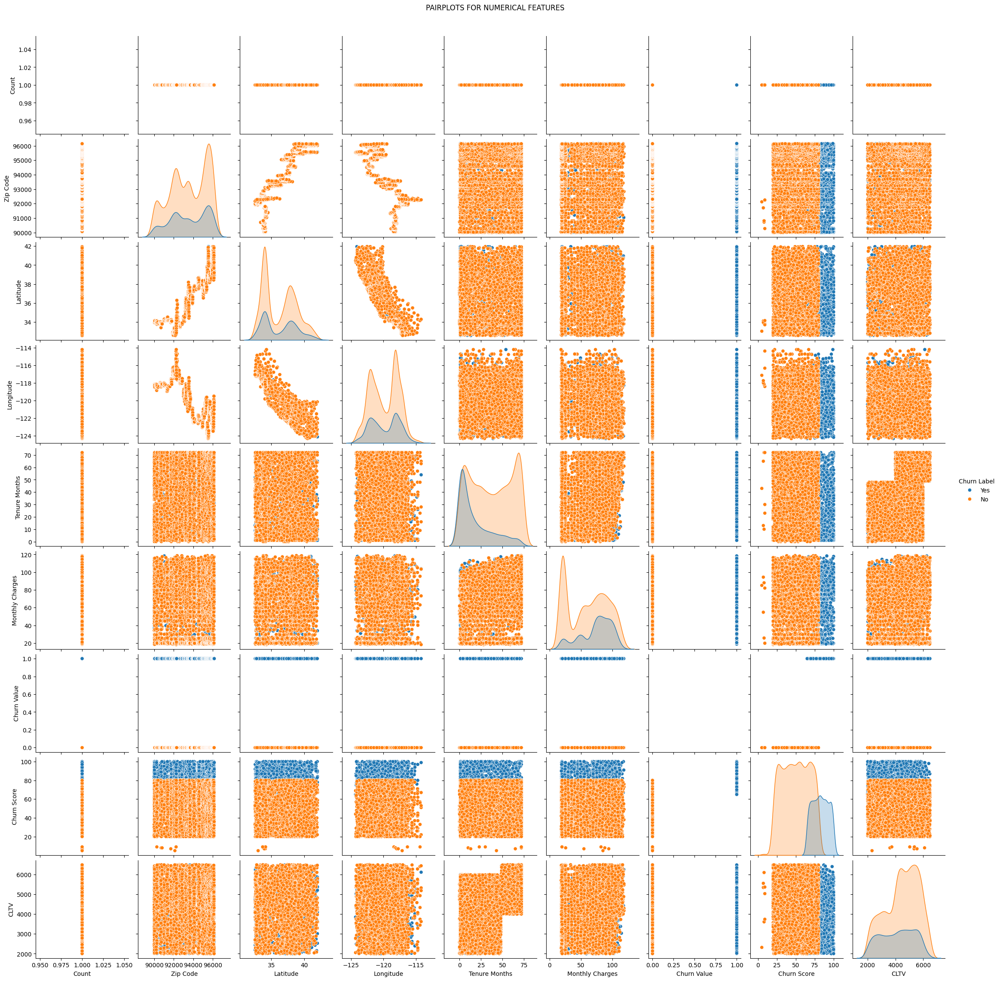

In [ ]:
if len(numerical_columns) > 1:
    sns.pairplot(df, vars=numerical_columns, hue='Churn Label', diag_kind='kde')
    plt.suptitle('PAIRPLOTS FOR NUMERICAL FEATURES', y=1.02)
    plt.show()
else:
    print("Not enough numerical features to create a pairplot.")

*Step 7: Plot Correlation matrix for all numerical features*

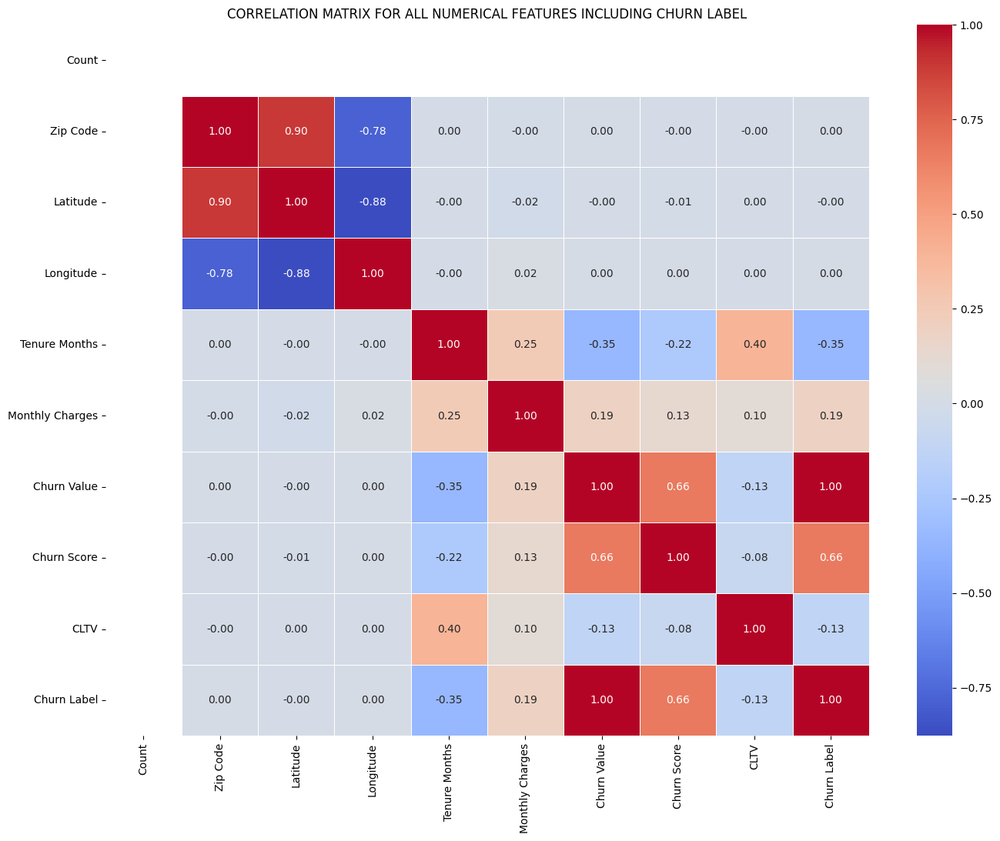

In [ ]:
plt.figure(figsize=(16, 12))
df['Churn Label'] = df['Churn Label'].map({'Yes': 1, 'No': 0}).fillna(0).astype(int)
current_numerical_columns = df.select_dtypes(include=['int64', 'float', 'int32']).columns.tolist()
if 'Churn Label' in current_numerical_columns:
    current_numerical_columns.remove('Churn Label')
correlation_matrix = df[current_numerical_columns + ['Churn Label']].corr()
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=.5)
plt.title('CORRELATION MATRIX FOR ALL NUMERICAL FEATURES INCLUDING CHURN LABEL')
plt.show()

*Step 8: Plot Boxplots for numerical features*

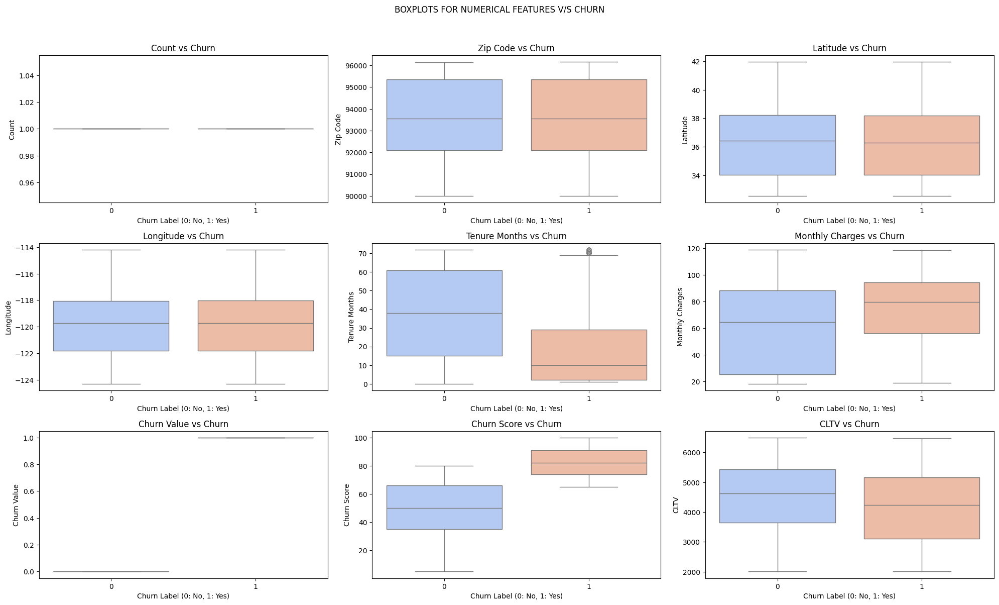

In [ ]:
plt.figure(figsize=(20, 15))
for i, col in enumerate(numerical_columns):
    plt.subplot(4, 3, i + 1)
    sns.boxplot(data=df, x='Churn Label', y=col, hue='Churn Label', palette='coolwarm', legend=False)
    plt.title(f'{col} vs Churn')
    plt.suptitle('BOXPLOTS FOR NUMERICAL FEATURES V/S CHURN', y=1.02)
    plt.xlabel('Churn Label (0: No, 1: Yes)')
    plt.ylabel(col)
plt.tight_layout()
plt.show()

**4. Perform Data Pre-processing based on the inferences from EDA.**

*Step 1: Handle missing values if any*

In [ ]:
null_counts = df.isnull().sum()
print("Missing values for every column:")
print(null_counts)

Missing values for every column:
CustomerID              0
Count                   0
Country                 0
State                   0
City                    0
Zip Code                0
Lat Long                0
Latitude                0
Longitude               0
Gender                  0
Senior Citizen          0
Partner                 0
Dependents              0
Tenure Months           0
Phone Service           0
Multiple Lines          0
Internet Service        0
Online Security         0
Online Backup           0
Device Protection       0
Tech Support            0
Streaming TV            0
Streaming Movies        0
Contract                0
Paperless Billing       0
Payment Method          0
Monthly Charges         0
Total Charges           0
Churn Label             0
Churn Value             0
Churn Score             0
CLTV                    0
Churn Reason         5174
dtype: int64


*Step 2: Perform imputation for null counts*

In [ ]:
print('Null counts before imputation:')
print(df.isnull().sum()[df.isnull().sum() > 0])
numerical_missing = df.select_dtypes(include=['number']).isnull().sum()
numerical_missing = numerical_missing[numerical_missing > 0]
categorical_missing = df.select_dtypes(include=['object', 'category']).isnull().sum()
categorical_missing = categorical_missing[categorical_missing > 0]
for col in numerical_missing.index:
    median_value = df[col].median()
    df[col] = df[col].fillna(median_value)
    print(f"Filled numerical column '{col}' with median: {median_value}")
for col in categorical_missing.index:
    mode_value = df[col].mode()[0]
    df[col] = df[col].fillna(mode_value)
    print(f"Filled categorical column '{col}' with mode: {mode_value}")
print('\nNull counts after imputation:')
print(df.isnull().sum()[df.isnull().sum() > 0])

Null counts before imputation:
Churn Reason    5174
dtype: int64
Filled categorical column 'Churn Reason' with mode: Attitude of support person

Null counts after imputation:
Series([], dtype: int64)


*Step 3: Identify wrongly encoded features*

In [ ]:
import numpy as np
object_columns = df.select_dtypes(include='object').columns
wrongly_encoded_counts = {}
for col in object_columns:
    count = df[col].astype(str).str.strip().str.lower().isin(['', 'null']).sum()
    if count > 0:
        wrongly_encoded_counts[col] = count
if wrongly_encoded_counts:
    print("Columns with wrongly encoded blanks/whitespace:")
    for col, count in wrongly_encoded_counts.items():
        print(f"- {col}: {count} occurrences")
else:
    print("No wrongly encoded blanks/whitespace found in object columns.")
df['Total Charges'] = df['Total Charges'].astype(str).str.strip().replace('', np.nan)
df['Total Charges'] = pd.to_numeric(df['Total Charges'])

Columns with wrongly encoded blanks/whitespace:
- Total Charges: 11 occurrences


*Step 4: Perform One-hot encoding*

In [ ]:
binary_cols_yes_no = [
    'Partner',
    'Dependents',
    'Phone Service',
    'Paperless Billing',
    'Senior Citizen', # Added Senior Citizen to binary mapping
    # 'Churn Label' is handled separately in cell fXyfQ_S5a-O_ and should not be re-mapped here.
]
for col in binary_cols_yes_no:
    # Map 'Yes' to 1, 'No' to 0, and fill any resulting NaNs (from unmapped values) with 0
    df[col] = df[col].map({'Yes': 1, 'No': 0}).fillna(0).astype(int)
df['Gender'] = df['Gender'].map({'Male': 1, 'Female': 0})
ohe_cols = [
    'Multiple Lines',
    'Internet Service',
    'Online Security',
    'Online Backup',
    'Device Protection',
    'Tech Support',
    'Streaming TV',
    'Streaming Movies',
    'Contract',
    'Payment Method'
]
df = pd.get_dummies(df, columns=ohe_cols, drop_first=True)
drop_cols = [
    'CustomerID',
    'Count',
    'Country',
    'State',
    'City',
    'Zip Code',
    'Lat Long',
    'Latitude',
    'Longitude',
    'Churn Value',
    'Churn Score',
    'CLTV',
    'Churn Reason'
]
df = df.drop(columns=drop_cols, errors='ignore')
print("DataFrame after encoding and dropping columns:")
print(df.head())
print(f"\nNew DataFrame shape: {df.shape}")

DataFrame after encoding and dropping columns:
   Gender  Senior Citizen  Partner  Dependents  Tenure Months  Phone Service  \
0       1               0        0           0              2              1   
1       0               0        0           1              2              1   
2       0               0        0           1              8              1   
3       0               0        1           1             28              1   
4       1               0        0           1             49              1   

   Paperless Billing  Monthly Charges  Total Charges  Churn Label  ...  \
0                  1            53.85         108.15            1  ...   
1                  1            70.70         151.65            1  ...   
2                  1            99.65         820.50            1  ...   
3                  1           104.80        3046.05            1  ...   
4                  1           103.70        5036.30            1  ...   

   Tech Support_Yes  Stream

*Step 5: Identify and remove duplicates*

In [ ]:
print(f"DataFrame shape before removing duplicates: {df.shape}")
df.drop_duplicates(inplace=True)
print(f"DataFrame shape after removing duplicates: {df.shape}")

DataFrame shape before removing duplicates: (7043, 31)
DataFrame shape after removing duplicates: (7021, 31)


*Step 6: Detect outliers*

In [ ]:
numerical_features = ['Tenure Months', 'Monthly Charges', 'Total Charges']
print("Outlier Detection using IQR Method:")
for col in numerical_features:
    Q1 = df[col].quantile(0.25)
    Q3 = df[col].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    outliers = df[(df[col] < lower_bound) | (df[col] > upper_bound)]
    print(f"\nColumn: {col}")
    print(f"  Q1: {Q1:.2f}")
    print(f"  Q3: {Q3:.2f}")
    print(f"  IQR: {IQR:.2f}")
    print(f"  Lower Bound: {lower_bound:.2f}")
    print(f"  Upper Bound: {upper_bound:.2f}")
    print(f"  Number of outliers: {len(outliers)}")
    if len(outliers) > 0:
        print(f"  Outlier values (first 5):\n{outliers[col].head()}")

Outlier Detection using IQR Method:

Column: Tenure Months
  Q1: 9.00
  Q3: 55.00
  IQR: 46.00
  Lower Bound: -60.00
  Upper Bound: 124.00
  Number of outliers: 0

Column: Monthly Charges
  Q1: 35.75
  Q3: 89.90
  IQR: 54.15
  Lower Bound: -45.48
  Upper Bound: 171.12
  Number of outliers: 0

Column: Total Charges
  Q1: 408.31
  Q3: 3807.84
  IQR: 3399.53
  Lower Bound: -4690.98
  Upper Bound: 8907.12
  Number of outliers: 0


*Step 7: Fix the outliers detected in previous step*

In [ ]:
numerical_features = ['Tenure Months', 'Monthly Charges', 'Total Charges']
print("Fixing Outliers by Capping using IQR Method:")
for col in numerical_features:
    Q1 = df[col].quantile(0.25)
    Q3 = df[col].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    df[col] = np.where(df[col] < lower_bound, lower_bound, df[col])
    df[col] = np.where(df[col] > upper_bound, upper_bound, df[col])
    print(f"\nColumn: {col}")
    print(f"  Values below {lower_bound:.2f} capped to {lower_bound:.2f}")
    print(f"  Values above {upper_bound:.2f} capped to {upper_bound:.2f}")

Fixing Outliers by Capping using IQR Method:

Column: Tenure Months
  Values below -60.00 capped to -60.00
  Values above 124.00 capped to 124.00

Column: Monthly Charges
  Values below -45.48 capped to -45.48
  Values above 171.12 capped to 171.12

Column: Total Charges
  Values below -4690.98 capped to -4690.98
  Values above 8907.12 capped to 8907.12


*Step 8: Perform feature scaling*

In [ ]:
from sklearn.preprocessing import MinMaxScaler
numerical_cols_to_scale = ['Tenure Months', 'Monthly Charges', 'Total Charges']
scaler = MinMaxScaler()
df[numerical_cols_to_scale] = scaler.fit_transform(df[numerical_cols_to_scale])
print("DataFrame after Feature Scaling (MinMaxScaler):")
print(df[numerical_cols_to_scale].head())
print(f"\nNew DataFrame shape: {df.shape}")

DataFrame after Feature Scaling (MinMaxScaler):
   Tenure Months  Monthly Charges  Total Charges
0       0.027778         0.354229       0.010310
1       0.027778         0.521891       0.015330
2       0.111111         0.809950       0.092511
3       0.388889         0.861194       0.349325
4       0.680556         0.850249       0.578987

New DataFrame shape: (7021, 31)


*Step 9: Perform feature engineering*

*Step 9a: Feature engineer domain based features*

In [ ]:
df['AvgMonthlyPayment'] = df['Total Charges'] / (df['Tenure Months'] + (1/df['Tenure Months'].max())) # Approx. scale +1
scaled_12_months_threshold = 12 / 72.0 # Adjust based on domain knowledge or actual max_original_tenure if known
df['IsLongTermCustomer'] = (df['Tenure Months'] > scaled_12_months_threshold).astype(int)
df['NumServices'] = df['Phone Service'] + \
                    df['Multiple Lines_Yes'].astype(int) + \
                    (1 - df['Internet Service_No'].astype(int)) + \
                    df['Online Security_Yes'].astype(int) + \
                    df['Online Backup_Yes'].astype(int) + \
                    df['Device Protection_Yes'].astype(int) + \
                    df['Tech Support_Yes'].astype(int) + \
                    df['Streaming TV_Yes'].astype(int) + \
                    df['Streaming Movies_Yes'].astype(int)
print("DataFrame with new features:")
print(df[['Tenure Months', 'Total Charges', 'AvgMonthlyPayment', 'IsLongTermCustomer', 'NumServices']].head())
print(f"\nNew DataFrame shape: {df.shape}")

DataFrame with new features:
   Tenure Months  Total Charges  AvgMonthlyPayment  IsLongTermCustomer  \
0       0.027778       0.010310           0.010032                   0   
1       0.027778       0.015330           0.014916                   0   
2       0.111111       0.092511           0.083260                   0   
3       0.388889       0.349325           0.251514                   1   
4       0.680556       0.578987           0.344521                   1   

   NumServices  
0            4  
1            2  
2            6  
3            7  
4            7  

New DataFrame shape: (7021, 34)


*Step 9b: Feature engineer interaction features*

In [ ]:
contract_cols = [col for col in df.columns if col.startswith('Contract_')]
internet_cols = [col for col in df.columns if col.startswith('Internet Service_')]
for c_col in contract_cols:
    for i_col in internet_cols:
        if 'No internet service' in i_col and 'No internet service' not in c_col:
            continue
        interaction_col_name = f"{c_col}_x_{i_col}".replace('Contract_','').replace('Internet Service_','').replace(' ','_').replace('-','_')
        df[interaction_col_name] = df[c_col] * df[i_col]
df['Tenure_x_MonthlyCharges'] = df['Tenure Months'] * df['Monthly Charges']
print("DataFrame with new interaction features (head of relevant columns):")
print(df[[col for col in df.columns if ('_x_' in col or 'Tenure_x_MonthlyCharges' in col) or col in ['Tenure Months', 'Monthly Charges', 'Contract_One year', 'Internet Service_Fiber optic']]].head())
print(f"\nNew DataFrame shape: {df.shape}")

DataFrame with new interaction features (head of relevant columns):
   Tenure Months  Monthly Charges  Internet Service_Fiber optic  \
0       0.027778         0.354229                         False   
1       0.027778         0.521891                          True   
2       0.111111         0.809950                          True   
3       0.388889         0.861194                          True   
4       0.680556         0.850249                          True   

   Contract_One year  One_year_x_Fiber_optic  One_year_x_No  \
0              False                   False          False   
1              False                   False          False   
2              False                   False          False   
3              False                   False          False   
4              False                   False          False   

   Two_year_x_Fiber_optic  Two_year_x_No  Tenure_x_MonthlyCharges  
0                   False          False                 0.009840  
1             

*Step 10: Perform feature selection*

In [ ]:
X = df.drop('Churn Label', axis=1)
y = df['Churn Label']
categorical_features = X.select_dtypes(include=['object', 'bool']).columns
numerical_features = X.select_dtypes(include=['int64', 'float64', 'int32', 'float32']).columns
print(f"Categorical Features ({len(categorical_features)}):\n{list(categorical_features)}")
print(f"\nNumerical Features ({len(numerical_features)}):\n{list(numerical_features)}")

Categorical Features (25):
['Multiple Lines_No phone service', 'Multiple Lines_Yes', 'Internet Service_Fiber optic', 'Internet Service_No', 'Online Security_No internet service', 'Online Security_Yes', 'Online Backup_No internet service', 'Online Backup_Yes', 'Device Protection_No internet service', 'Device Protection_Yes', 'Tech Support_No internet service', 'Tech Support_Yes', 'Streaming TV_No internet service', 'Streaming TV_Yes', 'Streaming Movies_No internet service', 'Streaming Movies_Yes', 'Contract_One year', 'Contract_Two year', 'Payment Method_Credit card (automatic)', 'Payment Method_Electronic check', 'Payment Method_Mailed check', 'One_year_x_Fiber_optic', 'One_year_x_No', 'Two_year_x_Fiber_optic', 'Two_year_x_No']

Numerical Features (13):
['Gender', 'Senior Citizen', 'Partner', 'Dependents', 'Tenure Months', 'Phone Service', 'Paperless Billing', 'Monthly Charges', 'Total Charges', 'AvgMonthlyPayment', 'IsLongTermCustomer', 'NumServices', 'Tenure_x_MonthlyCharges']


*Step 11: Check for class imbalance*

In [ ]:
print("Class Imbalance Check")
churn_distribution = df['Churn Label'].value_counts(normalize=True) * 100
print("Churn Label Distribution:")
print(churn_distribution)
if churn_distribution.get(1, 0) < 30:
    print("\nThe dataset exhibits a significant class imbalance for Churn (Yes < 30%).")
else:
    print("\nClass imbalance is not severe based on the typical churn rate.")

Class Imbalance Check
Churn Label Distribution:
Churn Label
0    73.550776
1    26.449224
Name: proportion, dtype: float64

The dataset exhibits a significant class imbalance for Churn (Yes < 30%).


**5. Perform Exploratory Data Analysis once again after Data Pre-processing**

--- EDA after Preprocessing ---

Plotting Histograms for Numerical Features...


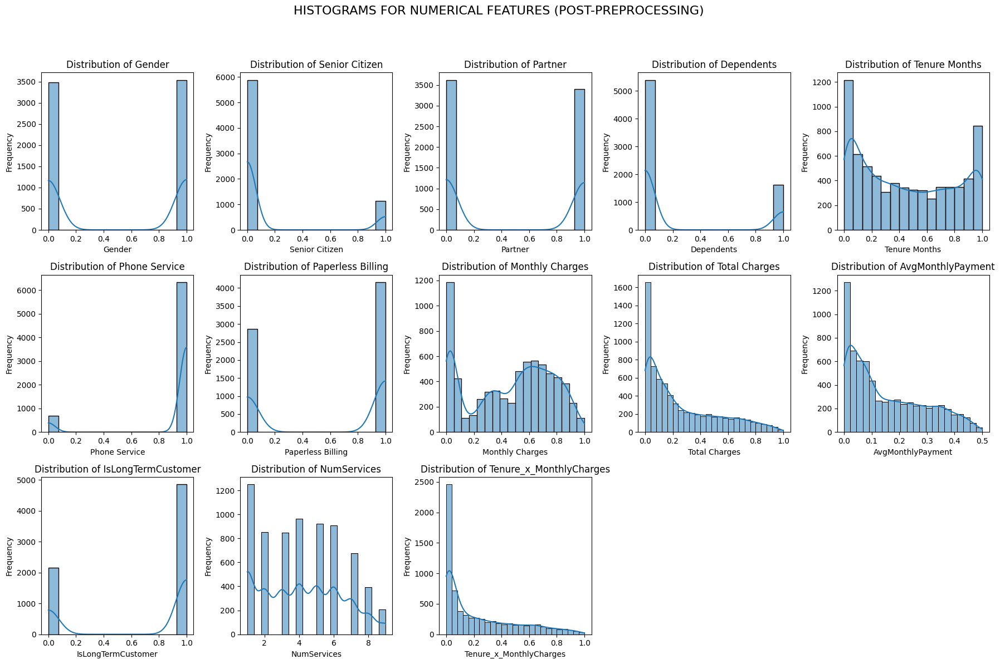


Plotting Countplots for Categorical Features...


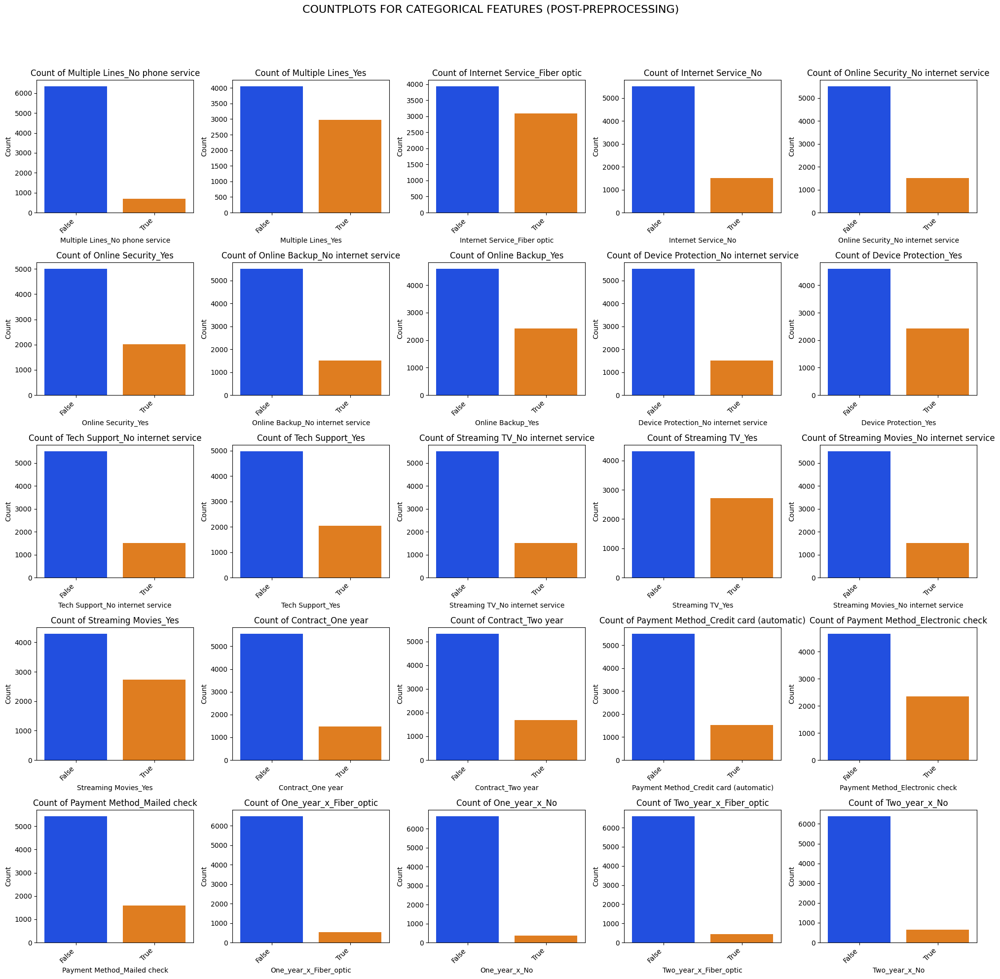


Plotting Pairplots for Numerical Features vs Churn Label...


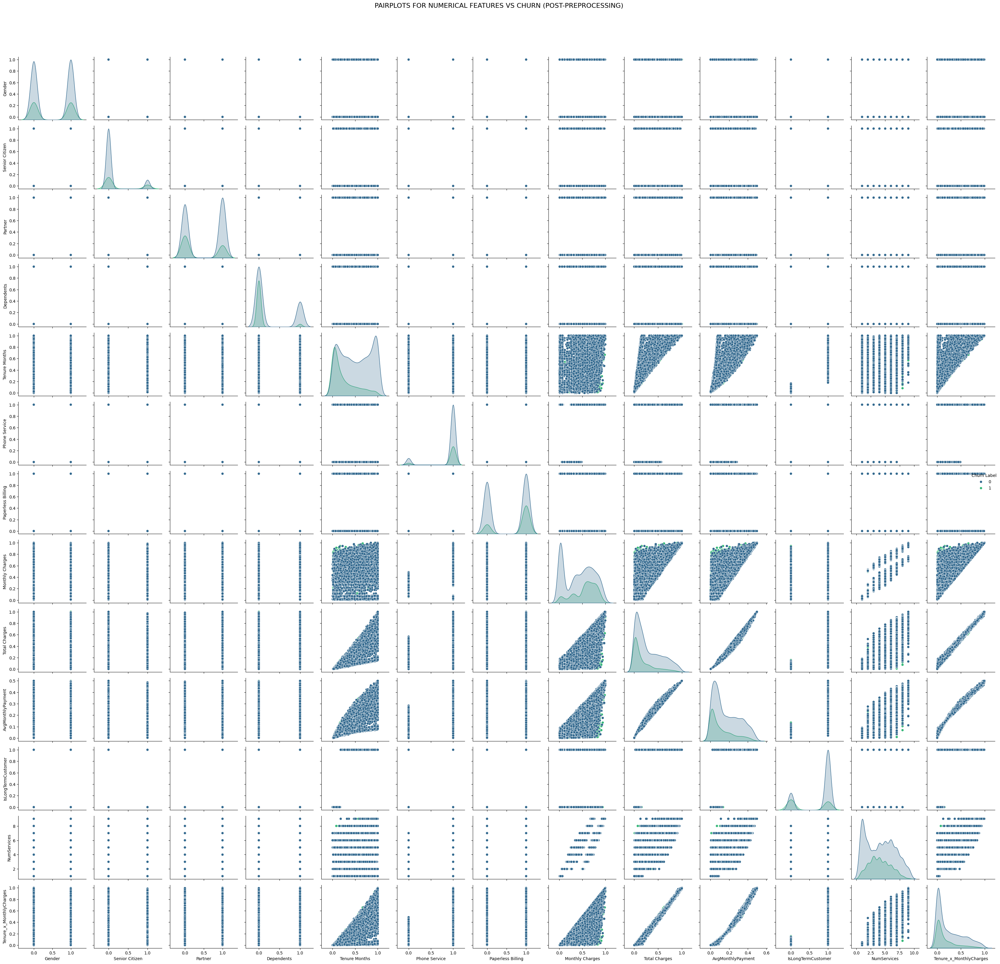


Plotting Correlation Matrix...


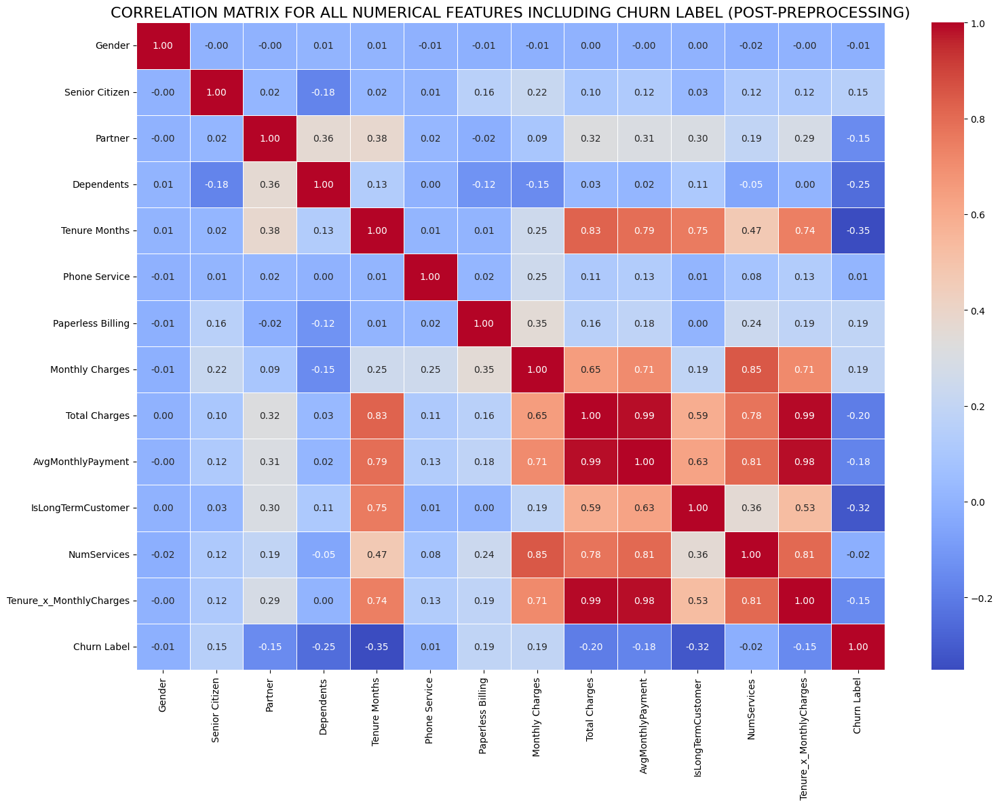


Plotting Boxplots for Numerical Features vs Churn Label...


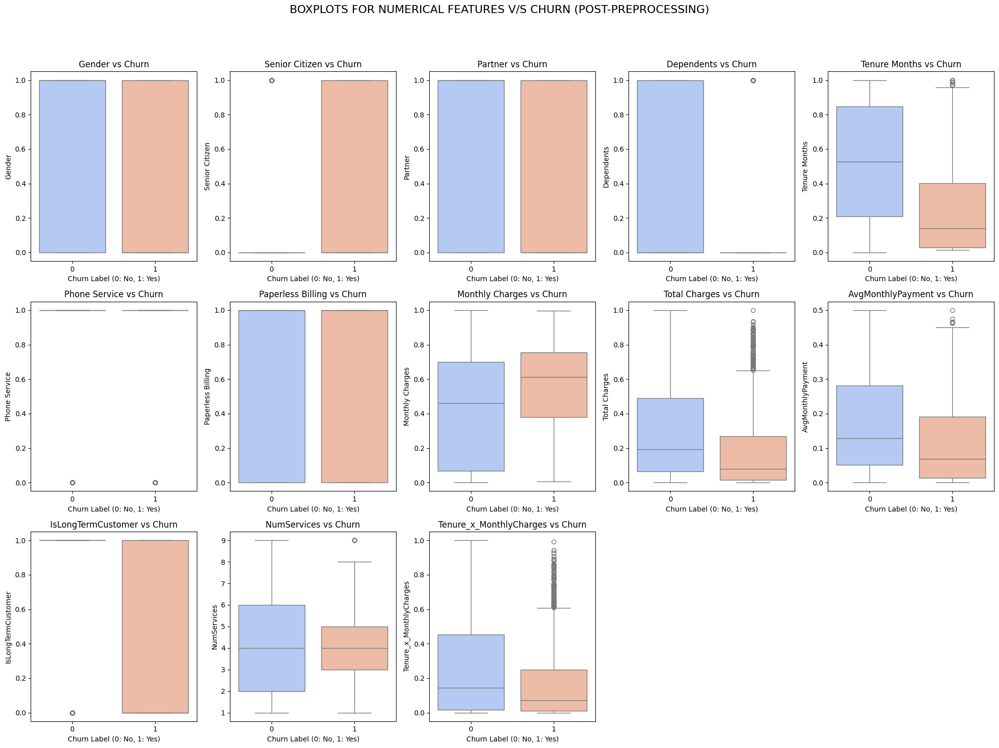

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# Define numerical and categorical features based on the preprocessed df
# Using the lists from the kernel state which were correctly identified after preprocessing.
numerical_features = ['Gender', 'Senior Citizen', 'Partner', 'Dependents', 'Tenure Months', 'Phone Service', 'Paperless Billing', 'Monthly Charges', 'Total Charges', 'AvgMonthlyPayment', 'IsLongTermCustomer', 'NumServices', 'Tenure_x_MonthlyCharges']
categorical_features = ['Multiple Lines_No phone service', 'Multiple Lines_Yes', 'Internet Service_Fiber optic', 'Internet Service_No', 'Online Security_No internet service', 'Online Security_Yes', 'Online Backup_No internet service', 'Online Backup_Yes', 'Device Protection_No internet service', 'Device Protection_Yes', 'Tech Support_No internet service', 'Tech Support_Yes', 'Streaming TV_No internet service', 'Streaming TV_Yes', 'Streaming Movies_No internet service', 'Streaming Movies_Yes', 'Contract_One year', 'Contract_Two year', 'Payment Method_Credit card (automatic)', 'Payment Method_Electronic check', 'Payment Method_Mailed check', 'One_year_x_Fiber_optic', 'One_year_x_No', 'Two_year_x_Fiber_optic', 'Two_year_x_No']

print("--- EDA after Preprocessing ---")

# --- 1. Histograms for numerical features ---
print("\nPlotting Histograms for Numerical Features...")
plt.figure(figsize=(18, 12))
for i, col in enumerate(numerical_features):
    plt.subplot(3, 5, i + 1) # Adjust subplot grid based on number of numerical features
    sns.histplot(df[col], kde=True)
    plt.title(f'Distribution of {col}')
    plt.xlabel(col)
    plt.ylabel('Frequency')
plt.suptitle('HISTOGRAMS FOR NUMERICAL FEATURES (POST-PREPROCESSING)', y=1.02, fontsize=16)
plt.tight_layout(rect=[0, 0.03, 1, 0.98]) # Adjust layout to prevent suptitle overlap
plt.show()

# --- 2. Countplots for categorical features ---
print("\nPlotting Countplots for Categorical Features...")
num_cat_features = len(categorical_features)
ncols = 5 # Number of columns for subplots
nrows = (num_cat_features + ncols - 1) // ncols # Calculate rows needed

plt.figure(figsize=(20, nrows * 4)) # Adjust height dynamically
for i, col in enumerate(categorical_features):
    plt.subplot(nrows, ncols, i + 1)
    sns.countplot(data=df, x=col, hue=col, palette='bright', legend=False)
    plt.title(f'Count of {col}')
    plt.xlabel(col)
    plt.ylabel('Count')
    plt.xticks(rotation=45, ha='right')
plt.suptitle('COUNTPLOTS FOR CATEGORICAL FEATURES (POST-PREPROCESSING)', y=1.02, fontsize=16)
plt.tight_layout(rect=[0, 0.03, 1, 0.98])
plt.show()

# --- 3. Pairplots for numerical features vs Churn Label ---
print("\nPlotting Pairplots for Numerical Features vs Churn Label...")
# 'Churn Label' is already 0/1 int. It's not in numerical_features.
pairplot_df = df[numerical_features + ['Churn Label']]
if len(numerical_features) > 0:
    # Plot all numerical features against each other, colored by 'Churn Label'
    sns.pairplot(pairplot_df, hue='Churn Label', diag_kind='kde', palette='viridis', vars=numerical_features)
    plt.suptitle('PAIRPLOTS FOR NUMERICAL FEATURES VS CHURN (POST-PREPROCESSING)', y=1.02, fontsize=16)
    plt.tight_layout(rect=[0, 0.03, 1, 0.98])
    plt.show()
else:
    print("Not enough numerical features (excluding Churn Label) to create a pairplot.")


# --- 4. Correlation matrix for all numerical features including Churn Label ---
print("\nPlotting Correlation Matrix...")
# Create a list of all numerical-type columns for correlation, including 'Churn Label'
all_numerical_for_corr = [col for col in numerical_features] # Start with the identified numerical features
if 'Churn Label' not in all_numerical_for_corr:
    all_numerical_for_corr.append('Churn Label') # Add Churn Label if it's not already there

plt.figure(figsize=(16, 12))
correlation_matrix = df[all_numerical_for_corr].corr()
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=.5)
plt.title('CORRELATION MATRIX FOR ALL NUMERICAL FEATURES INCLUDING CHURN LABEL (POST-PREPROCESSING)', fontsize=16)
plt.tight_layout()
plt.show()

# --- 5. Boxplots for numerical features vs Churn Label ---
print("\nPlotting Boxplots for Numerical Features vs Churn Label...")
# 'Churn Label' is already 0/1 int.
plt.figure(figsize=(20, 15))
for i, col in enumerate(numerical_features):
    plt.subplot(3, 5, i + 1) # Adjust subplot grid based on number of numerical features
    sns.boxplot(data=df, x='Churn Label', y=col, hue='Churn Label', palette='coolwarm', legend=False)
    plt.title(f'{col} vs Churn')
    plt.xlabel('Churn Label (0: No, 1: Yes)')
    plt.ylabel(col)
plt.suptitle('BOXPLOTS FOR NUMERICAL FEATURES V/S CHURN (POST-PREPROCESSING)', y=1.02, fontsize=16)
plt.tight_layout(rect=[0, 0.03, 1, 0.98])
plt.show()

**6. Apply Machine Learning Models supporting Supervised Learning**

*Step 1: Apply Linear Models*

*Step 1a: Logistic Regression*

NaNs found in X_train:
Total Charges        9
AvgMonthlyPayment    9
dtype: int64
  Filled X_train['Total Charges'] with median: 0.16
  Filled X_train['AvgMonthlyPayment'] with median: 0.11
NaNs found in X_val:
Total Charges        2
AvgMonthlyPayment    2
dtype: int64
  Filled X_val['Total Charges'] with median: 0.16
  Filled X_val['AvgMonthlyPayment'] with median: 0.11
END: NaN check and imputation
Logistic Regression model re-instantiated.
Logistic Regression model trained.

Logistic Regression Model Evaluation on Validation Set
Accuracy: 0.8071
Precision: 0.6772
Recall: 0.5188
F1-Score: 0.5875
ROC AUC Score: 0.8479

Confusion Matrix for Logistic Regression


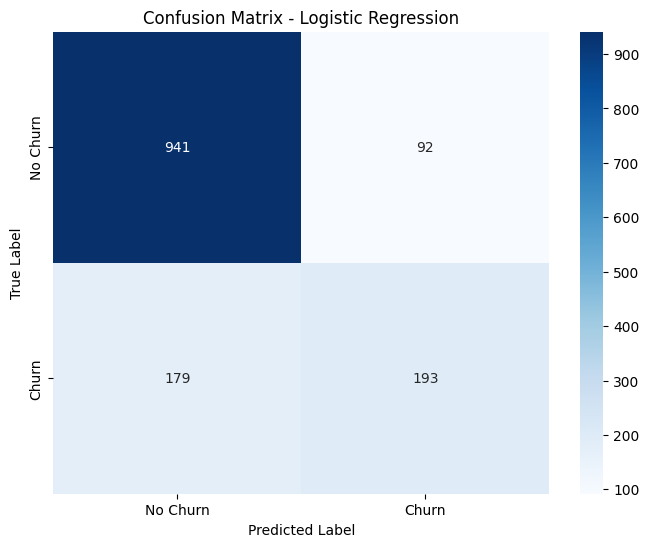


ROC Curve for Logistic Regression


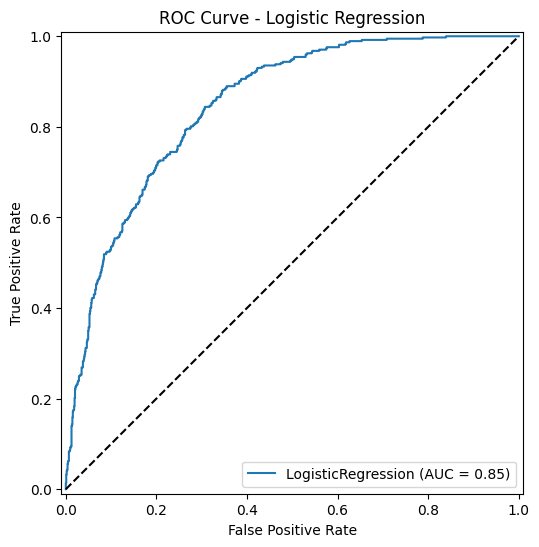

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, confusion_matrix, RocCurveDisplay
from sklearn.model_selection import train_test_split
import numpy as np # Import numpy for median calculation

# Split the data into training and validation sets
X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)

nans_in_xtrain = X_train.isnull().sum()
nans_in_xtrain = nans_in_xtrain[nans_in_xtrain > 0]
nans_in_xval = X_val.isnull().sum()
nans_in_xval = nans_in_xval[nans_in_xval > 0]

if not nans_in_xtrain.empty:
    print("NaNs found in X_train:")
    print(nans_in_xtrain)
    for col in nans_in_xtrain.index:
        median_val = X_train[col].median()
        X_train[col] = X_train[col].fillna(median_val)
        print(f"  Filled X_train['{col}'] with median: {median_val:.2f}")

if not nans_in_xval.empty:
    print("NaNs found in X_val:")
    print(nans_in_xval)
    for col in nans_in_xval.index:
        median_val = X_val[col].median()
        X_val[col] = X_val[col].fillna(median_val)
        print(f"  Filled X_val['{col}'] with median: {median_val:.2f}")

if nans_in_xtrain.empty and nans_in_xval.empty:
    print("No NaNs found in X_train or X_val.")

print("END: NaN check and imputation")
# END: NaN check and imputation for X_train and X_val


# 1. Re-instantiate the LogisticRegression model
log_reg = LogisticRegression(solver='liblinear', random_state=42)
print("Logistic Regression model re-instantiated.")

# 2. Train the log_reg model
log_reg.fit(X_train, y_train)
print("Logistic Regression model trained.")

# 3. Make predictions on the X_val dataset
y_pred_lr = log_reg.predict(X_val)

# 4. Calculate prediction probabilities for the positive class
y_prob_lr = log_reg.predict_proba(X_val)[:, 1] # Get probabilities for the positive class (1)

# 5. Evaluate the model's performance
print("\nLogistic Regression Model Evaluation on Validation Set")
print(f"Accuracy: {accuracy_score(y_val, y_pred_lr):.4f}")
print(f"Precision: {precision_score(y_val, y_pred_lr):.4f}")
print(f"Recall: {recall_score(y_val, y_pred_lr):.4f}")
print(f"F1-Score: {f1_score(y_val, y_pred_lr):.4f}")
print(f"ROC AUC Score: {roc_auc_score(y_val, y_prob_lr):.4f}")

# 6. Confusion Matrix
print("\nConfusion Matrix for Logistic Regression")
cm_lr = confusion_matrix(y_val, y_pred_lr)

plt.figure(figsize=(8, 6))
sns.heatmap(cm_lr, annot=True, fmt='d', cmap='Blues',
            xticklabels=['No Churn', 'Churn'], yticklabels=['No Churn', 'Churn'])
plt.title('Confusion Matrix - Logistic Regression')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.show()

# 7. ROC Curve
print("\nROC Curve for Logistic Regression")

plt.figure(figsize=(8, 6))
RocCurveDisplay.from_estimator(log_reg, X_val, y_val, ax=plt.gca())
plt.title('ROC Curve - Logistic Regression')
plt.plot([0, 1], [0, 1], 'k--') # Dashed diagonal line for reference
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.show()

*Step 1b: Support Vector Machine*

SVM Classifier model instantiated.
SVM Classifier model trained.

SVM Classifier Model Evaluation on Validation Set
Accuracy: 0.8064
Precision: 0.6866
Recall: 0.4946
F1-Score: 0.5750
ROC AUC Score: 0.8304

Confusion Matrix for SVM Classifier


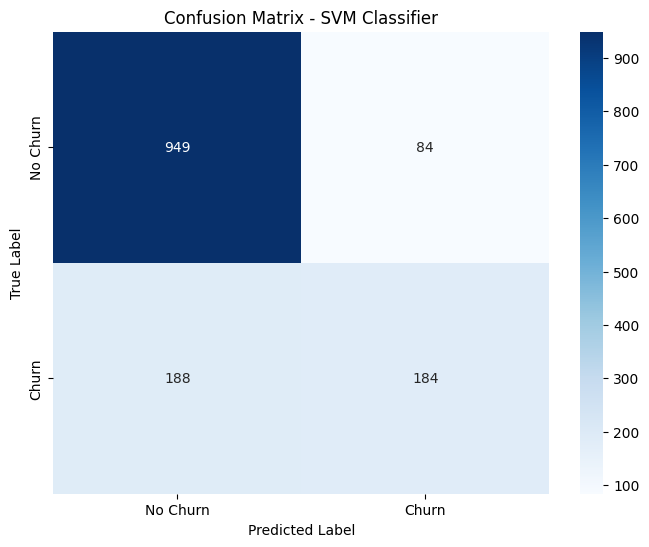


ROC Curve for SVM Classifier


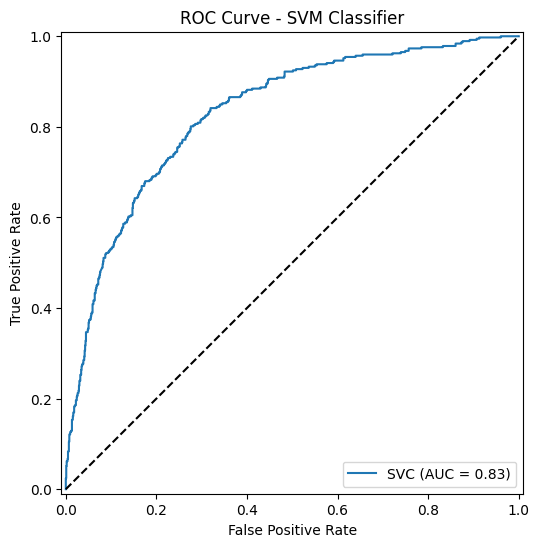

In [ ]:
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, confusion_matrix, RocCurveDisplay
import matplotlib.pyplot as plt
import seaborn as sns

# 1. Instantiate the SVM Classifier model
# Using probability=True to enable predict_proba for ROC AUC, though it can make training slower
svm_clf = SVC(random_state=42, probability=True)
print("SVM Classifier model instantiated.")

# 2. Train the svm_clf model
svm_clf.fit(X_train, y_train)
print("SVM Classifier model trained.")

# 3. Make predictions on the X_val dataset
y_pred_svm = svm_clf.predict(X_val)

# 4. Calculate prediction probabilities for the positive class
y_prob_svm = svm_clf.predict_proba(X_val)[:, 1] # Get probabilities for the positive class (1)

# 5. Evaluate the model's performance
print("\nSVM Classifier Model Evaluation on Validation Set")
print(f"Accuracy: {accuracy_score(y_val, y_pred_svm):.4f}")
print(f"Precision: {precision_score(y_val, y_pred_svm):.4f}")
print(f"Recall: {recall_score(y_val, y_pred_svm):.4f}")
print(f"F1-Score: {f1_score(y_val, y_pred_svm):.4f}")
print(f"ROC AUC Score: {roc_auc_score(y_val, y_prob_svm):.4f}")

# 6. Confusion Matrix
print("\nConfusion Matrix for SVM Classifier")
cm_svm = confusion_matrix(y_val, y_pred_svm)

plt.figure(figsize=(8, 6))
sns.heatmap(cm_svm, annot=True, fmt='d', cmap='Blues',
            xticklabels=['No Churn', 'Churn'], yticklabels=['No Churn', 'Churn'])
plt.title('Confusion Matrix - SVM Classifier')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.show()

# 7. ROC Curve
print("\nROC Curve for SVM Classifier")

plt.figure(figsize=(8, 6))
RocCurveDisplay.from_estimator(svm_clf, X_val, y_val, ax=plt.gca())
plt.title('ROC Curve - SVM Classifier')
plt.plot([0, 1], [0, 1], 'k--') # Dashed diagonal line for reference
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.show()

*Step 2: Apply Ensemble Techniques*

*Step 2a: Random Forest*

Random Forest Classifier model instantiated.
Random Forest Classifier model trained.

Random Forest Classifier Model Evaluation on Validation Set
Accuracy: 0.7858
Precision: 0.6203
Recall: 0.4919
F1-Score: 0.5487
ROC AUC Score: 0.8301

Confusion Matrix for Random Forest Classifier


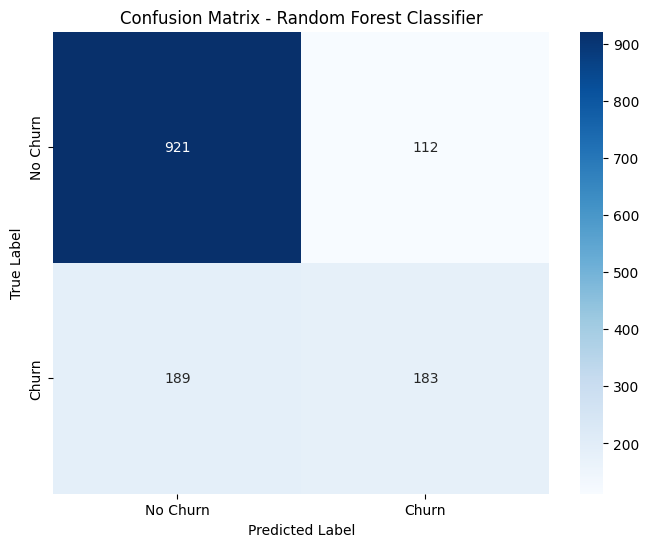


ROC Curve for Random Forest Classifier


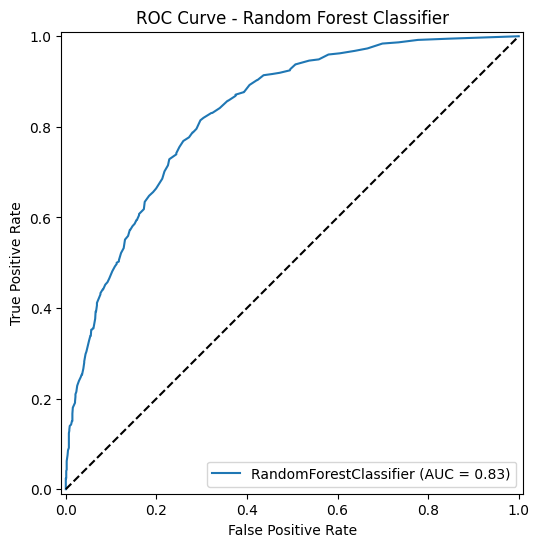

In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, confusion_matrix, RocCurveDisplay
import matplotlib.pyplot as plt
import seaborn as sns

# 1. Instantiate the Random Forest Classifier model
rf_clf = RandomForestClassifier(random_state=42)
print("Random Forest Classifier model instantiated.")

# 2. Train the rf_clf model
rf_clf.fit(X_train, y_train)
print("Random Forest Classifier model trained.")

# 3. Make predictions on the X_val dataset
y_pred_rf = rf_clf.predict(X_val)

# 4. Calculate prediction probabilities for the positive class
y_prob_rf = rf_clf.predict_proba(X_val)[:, 1] # Get probabilities for the positive class (1)

# 5. Evaluate the model's performance
print("\nRandom Forest Classifier Model Evaluation on Validation Set")
print(f"Accuracy: {accuracy_score(y_val, y_pred_rf):.4f}")
print(f"Precision: {precision_score(y_val, y_pred_rf):.4f}")
print(f"Recall: {recall_score(y_val, y_pred_rf):.4f}")
print(f"F1-Score: {f1_score(y_val, y_pred_rf):.4f}")
print(f"ROC AUC Score: {roc_auc_score(y_val, y_prob_rf):.4f}")

# 6. Confusion Matrix
print("\nConfusion Matrix for Random Forest Classifier")
cm_rf = confusion_matrix(y_val, y_pred_rf)

plt.figure(figsize=(8, 6))
sns.heatmap(cm_rf, annot=True, fmt='d', cmap='Blues',
            xticklabels=['No Churn', 'Churn'], yticklabels=['No Churn', 'Churn'])
plt.title('Confusion Matrix - Random Forest Classifier')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.show()

# 7. ROC Curve
print("\nROC Curve for Random Forest Classifier")

plt.figure(figsize=(8, 6))
RocCurveDisplay.from_estimator(rf_clf, X_val, y_val, ax=plt.gca())
plt.title('ROC Curve - Random Forest Classifier')
plt.plot([0, 1], [0, 1], 'k--') # Dashed diagonal line for reference
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.show()

*Step 2b: XGBoost*

XGBoost Classifier model instantiated.


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [11:23:57] WARNING: /workspace/src/learner.cc:790: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


XGBoost Classifier model trained.

XGBoost Classifier Model Evaluation on Validation Set
Accuracy: 0.7843
Precision: 0.6102
Recall: 0.5134
F1-Score: 0.5577
ROC AUC Score: 0.8338

Confusion Matrix for XGBoost Classifier


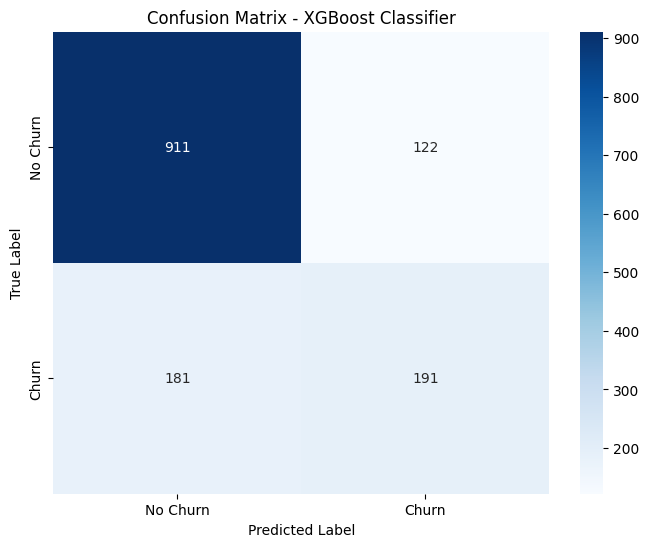


ROC Curve for XGBoost Classifier


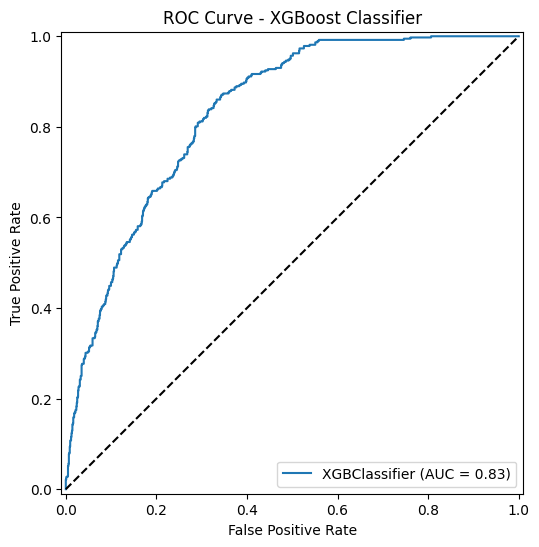

In [ ]:
from xgboost import XGBClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, confusion_matrix, RocCurveDisplay
import matplotlib.pyplot as plt
import seaborn as sns

# 1. Instantiate the XGBoost Classifier model
xgb_clf = XGBClassifier(use_label_encoder=False, eval_metric='logloss', random_state=42)
print("XGBoost Classifier model instantiated.")

# 2. Train the xgb_clf model
xgb_clf.fit(X_train, y_train)
print("XGBoost Classifier model trained.")

# 3. Make predictions on the X_val dataset
y_pred_xgb = xgb_clf.predict(X_val)

# 4. Calculate prediction probabilities for the positive class
y_prob_xgb = xgb_clf.predict_proba(X_val)[:, 1] # Get probabilities for the positive class (1)

# 5. Evaluate the model's performance
print("\nXGBoost Classifier Model Evaluation on Validation Set")
print(f"Accuracy: {accuracy_score(y_val, y_pred_xgb):.4f}")
print(f"Precision: {precision_score(y_val, y_pred_xgb):.4f}")
print(f"Recall: {recall_score(y_val, y_pred_xgb):.4f}")
print(f"F1-Score: {f1_score(y_val, y_pred_xgb):.4f}")
print(f"ROC AUC Score: {roc_auc_score(y_val, y_prob_xgb):.4f}")

# 6. Confusion Matrix
print("\nConfusion Matrix for XGBoost Classifier")
cm_xgb = confusion_matrix(y_val, y_pred_xgb)

plt.figure(figsize=(8, 6))
sns.heatmap(cm_xgb, annot=True, fmt='d', cmap='Blues',
            xticklabels=['No Churn', 'Churn'], yticklabels=['No Churn', 'Churn'])
plt.title('Confusion Matrix - XGBoost Classifier')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.show()

# 7. ROC Curve
print("\nROC Curve for XGBoost Classifier")

plt.figure(figsize=(8, 6))
RocCurveDisplay.from_estimator(xgb_clf, X_val, y_val, ax=plt.gca())
plt.title('ROC Curve - XGBoost Classifier')
plt.plot([0, 1], [0, 1], 'k--') # Dashed diagonal line for reference
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.show()

*Step 2c: Light Gradient Boosting Machine*

LGBM Classifier model instantiated.
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 1485, number of negative: 4131
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001420 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1167
[LightGBM] [Info] Number of data points in the train set: 5616, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.264423 -> initscore=-1.023105
[LightGBM] [Info] Start training from score -1.023105
LGBM Classifier model trained.

LGBM Classifier Model Evaluation on Validation Set
Accuracy: 0.7843
Precision: 0.6124
Recall: 0.5054
F1-Score: 0.5538
ROC AUC Score: 0.8424

Confusion Matrix for LGBM Classifier


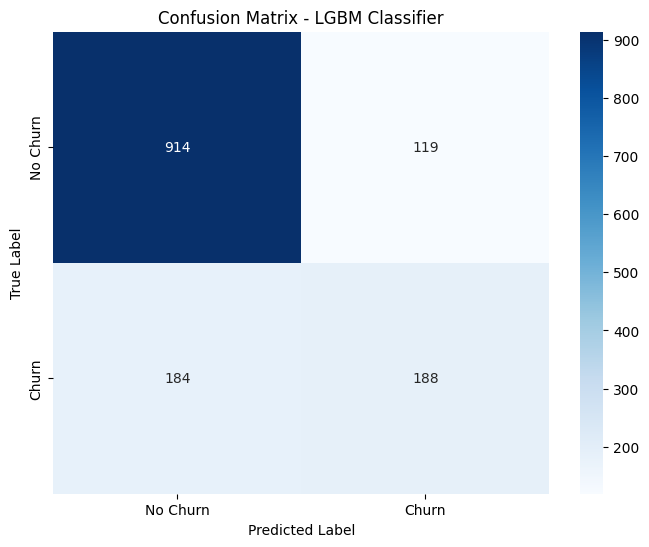


ROC Curve for LGBM Classifier


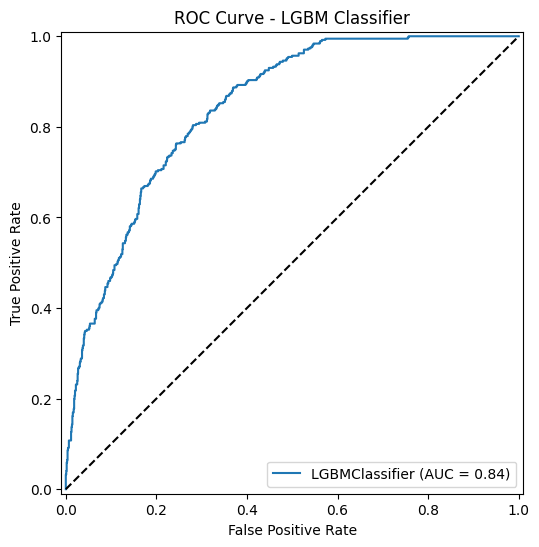

In [ ]:
from lightgbm import LGBMClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, confusion_matrix, RocCurveDisplay
import matplotlib.pyplot as plt
import seaborn as sns

# 1. Instantiate the LGBM Classifier model
lgbm_clf = LGBMClassifier(random_state=42)
print("LGBM Classifier model instantiated.")

# 2. Train the lgbm_clf model
lgbm_clf.fit(X_train, y_train)
print("LGBM Classifier model trained.")

# 3. Make predictions on the X_val dataset
y_pred_lgbm = lgbm_clf.predict(X_val)

# 4. Calculate prediction probabilities for the positive class
y_prob_lgbm = lgbm_clf.predict_proba(X_val)[:, 1] # Get probabilities for the positive class (1)

# 5. Evaluate the model's performance
print("\nLGBM Classifier Model Evaluation on Validation Set")
print(f"Accuracy: {accuracy_score(y_val, y_pred_lgbm):.4f}")
print(f"Precision: {precision_score(y_val, y_pred_lgbm):.4f}")
print(f"Recall: {recall_score(y_val, y_pred_lgbm):.4f}")
print(f"F1-Score: {f1_score(y_val, y_pred_lgbm):.4f}")
print(f"ROC AUC Score: {roc_auc_score(y_val, y_prob_lgbm):.4f}")

# 6. Confusion Matrix
print("\nConfusion Matrix for LGBM Classifier")
cm_lgbm = confusion_matrix(y_val, y_pred_lgbm)

plt.figure(figsize=(8, 6))
sns.heatmap(cm_lgbm, annot=True, fmt='d', cmap='Blues',
            xticklabels=['No Churn', 'Churn'], yticklabels=['No Churn', 'Churn'])
plt.title('Confusion Matrix - LGBM Classifier')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.show()

# 7. ROC Curve
print("\nROC Curve for LGBM Classifier")

plt.figure(figsize=(8, 6))
RocCurveDisplay.from_estimator(lgbm_clf, X_val, y_val, ax=plt.gca())
plt.title('ROC Curve - LGBM Classifier')
plt.plot([0, 1], [0, 1], 'k--') # Dashed diagonal line for reference
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.show()

*Step 3: Apply KNN for distance based measures*

KNN Classifier model instantiated.
KNN Classifier model trained.

KNN Classifier Model Evaluation on Validation Set
Accuracy: 0.7715
Precision: 0.5731
Recall: 0.5376
F1-Score: 0.5548
ROC AUC Score: 0.7894

Confusion Matrix for KNN Classifier


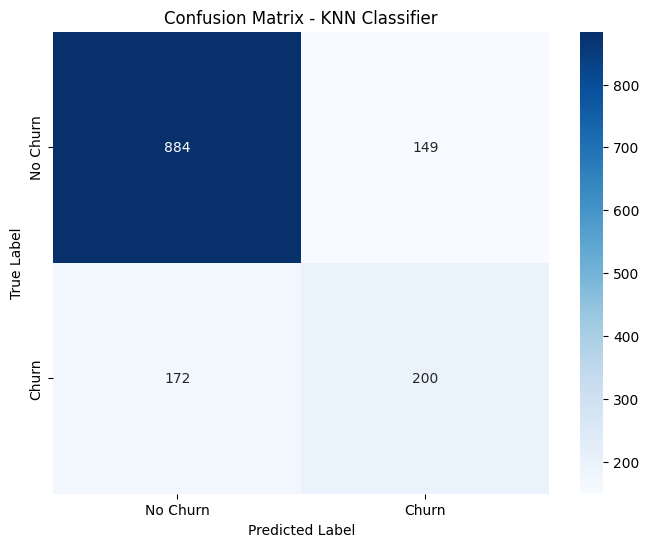


ROC Curve for KNN Classifier


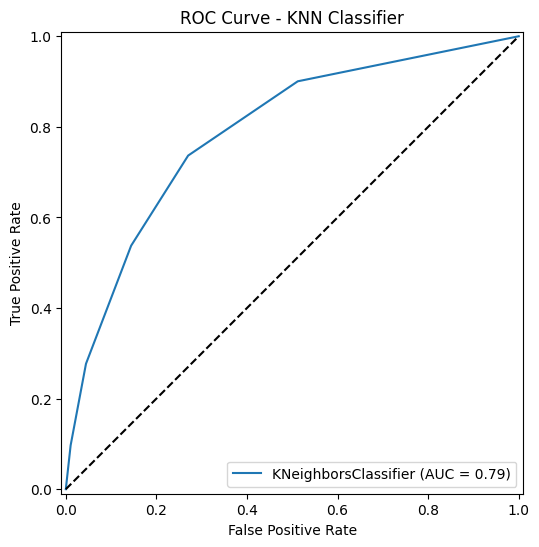

In [ ]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, confusion_matrix, RocCurveDisplay
import matplotlib.pyplot as plt
import seaborn as sns

# 1. Instantiate the KNN Classifier model
knn_clf = KNeighborsClassifier()
print("KNN Classifier model instantiated.")

# 2. Train the knn_clf model
knn_clf.fit(X_train, y_train)
print("KNN Classifier model trained.")

# 3. Make predictions on the X_val dataset
y_pred_knn = knn_clf.predict(X_val)

# 4. Calculate prediction probabilities for the positive class
y_prob_knn = knn_clf.predict_proba(X_val)[:, 1] # Get probabilities for the positive class (1)

# 5. Evaluate the model's performance
print("\nKNN Classifier Model Evaluation on Validation Set")
print(f"Accuracy: {accuracy_score(y_val, y_pred_knn):.4f}")
print(f"Precision: {precision_score(y_val, y_pred_knn):.4f}")
print(f"Recall: {recall_score(y_val, y_pred_knn):.4f}")
print(f"F1-Score: {f1_score(y_val, y_pred_knn):.4f}")
print(f"ROC AUC Score: {roc_auc_score(y_val, y_prob_knn):.4f}")

# 6. Confusion Matrix
print("\nConfusion Matrix for KNN Classifier")
cm_knn = confusion_matrix(y_val, y_pred_knn)

plt.figure(figsize=(8, 6))
sns.heatmap(cm_knn, annot=True, fmt='d', cmap='Blues',
            xticklabels=['No Churn', 'Churn'], yticklabels=['No Churn', 'Churn'])
plt.title('Confusion Matrix - KNN Classifier')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.show()

# 7. ROC Curve
print("\nROC Curve for KNN Classifier")

plt.figure(figsize=(8, 6))
RocCurveDisplay.from_estimator(knn_clf, X_val, y_val, ax=plt.gca())
plt.title('ROC Curve - KNN Classifier')
plt.plot([0, 1], [0, 1], 'k--') # Dashed diagonal line for reference
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.show()

**7. Apply Deep Learning Models supporting Supervised Learning**

*Step 1: Atrificial Neural Network (Baseline Model)*

ANN Model Summary:


/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/input_layer.py:27: UserWarning: Argument `input_shape` is deprecated. Use `shape` instead.
  warnings.warn(


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense (Dense)                   │ (None, 128)            │         4,992 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 128)            │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 64)             │         8,256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 64)             │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 1)              │            65 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 14,081 (55.00 KB)

 Trainable params: 13,697 (53.50 KB)

 Non-trainable params: 384 (1.50 KB)


Training ANN model...
ANN model trained.
44/44 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step

ANN Model Evaluation on Validation Set
Accuracy: 0.7879
Precision: 0.6051
Recall: 0.5726
F1-Score: 0.5884
ROC AUC Score: 0.8309

Confusion Matrix for ANN Model


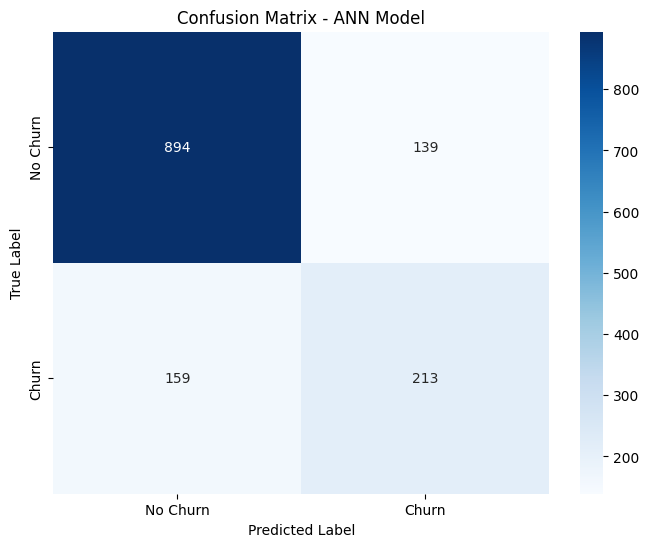


ROC Curve for ANN Model


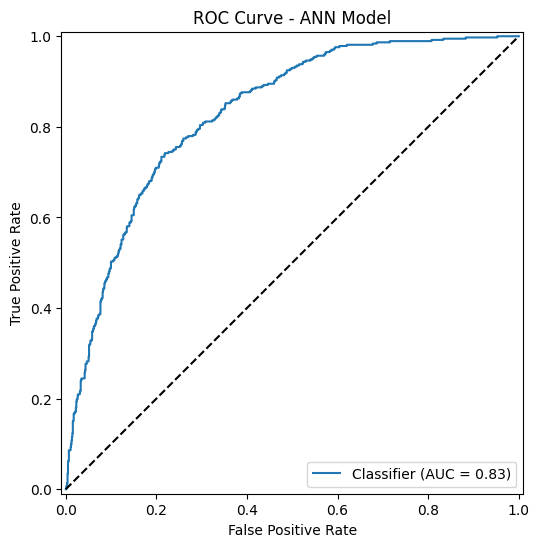

In [ ]:
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, confusion_matrix, RocCurveDisplay
import matplotlib.pyplot as plt
import seaborn as sns

# Get the number of features for the input layer
input_shape = X_train.shape[1]

# Define the ANN model architecture
model = keras.Sequential([
    layers.InputLayer(input_shape=(input_shape,)),
    layers.Dense(128, activation='relu'),
    layers.BatchNormalization(),
    layers.Dropout(0.3),
    layers.Dense(64, activation='relu'),
    layers.BatchNormalization(),
    layers.Dropout(0.3),
    layers.Dense(1, activation='sigmoid') # Output layer for binary classification
])

# Compile the model
model.compile(
    optimizer='adam',
    loss='binary_crossentropy',
    metrics=['accuracy']
)

# Display model summary
print("ANN Model Summary:")
model.summary()

# Train the model
print("\nTraining ANN model...")
history = model.fit(
    X_train,
    y_train,
    epochs=50, # You can adjust the number of epochs
    batch_size=32, # You can adjust the batch size
    validation_data=(X_val, y_val),
    verbose=0 # Suppress verbose output during training
)
print("ANN model trained.")

# Make predictions on the validation set
y_prob_ann = model.predict(X_val).flatten()
y_pred_ann = (y_prob_ann > 0.5).astype(int)

# Evaluate the model's performance
print("\nANN Model Evaluation on Validation Set")
print(f"Accuracy: {accuracy_score(y_val, y_pred_ann):.4f}")
print(f"Precision: {precision_score(y_val, y_pred_ann):.4f}")
print(f"Recall: {recall_score(y_val, y_pred_ann):.4f}")
print(f"F1-Score: {f1_score(y_val, y_pred_ann):.4f}")
print(f"ROC AUC Score: {roc_auc_score(y_val, y_prob_ann):.4f}")

#Confusion Matrix
print("\nConfusion Matrix for ANN Model")
cm_ann = confusion_matrix(y_val, y_pred_ann)

plt.figure(figsize=(8, 6))
sns.heatmap(cm_ann, annot=True, fmt='d', cmap='Blues',
            xticklabels=['No Churn', 'Churn'], yticklabels=['No Churn', 'Churn'])
plt.title('Confusion Matrix - ANN Model')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.show()

# ROC Curve
print("\nROC Curve for ANN Model")

plt.figure(figsize=(8, 6))
RocCurveDisplay.from_predictions(y_val, y_prob_ann, ax=plt.gca())
plt.title('ROC Curve - ANN Model')
plt.plot([0, 1], [0, 1], 'k--') # Dashed diagonal line for reference
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.show()

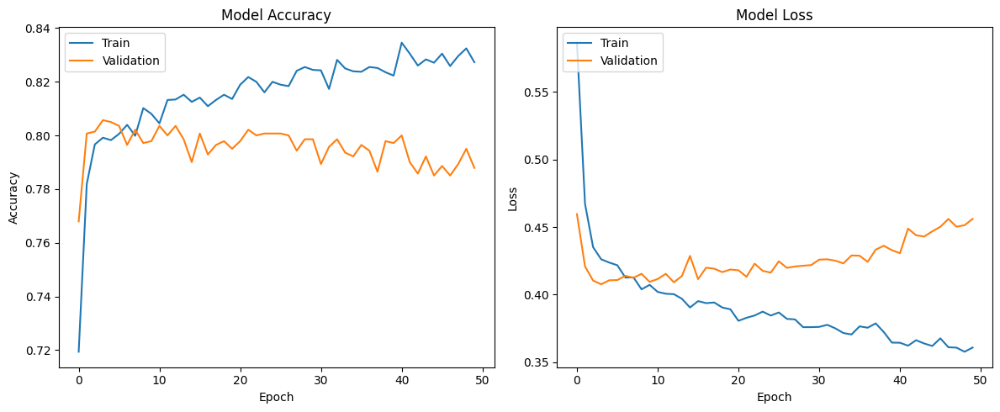

In [ ]:
# Plot training & validation accuracy values
plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('Model Accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')

# Plot training & validation loss values
plt.subplot(1, 2, 2)
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model Loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')

plt.tight_layout()
plt.show()

*Step 2: Long Short-Term Memory (Sequential Feature Extractor)*

In [ ]:
import numpy as np

# 1. Determine the number of samples and features
n_samples_train, n_features_train = X_train.shape
n_samples_val, n_features_val = X_val.shape

print(f"Original X_train shape: ({n_samples_train}, {n_features_train})")
print(f"Original X_val shape: ({n_samples_val}, {n_features_val})")

# 2. Reshape X_train to (samples, features, 1)
X_train_reshaped = X_train.values.reshape(n_samples_train, n_features_train, 1)

# 3. Reshape X_val to (samples, features, 1)
X_val_reshaped = X_val.values.reshape(n_samples_val, n_features_val, 1)

# 4. Print the new shapes to confirm
print(f"New X_train shape: {X_train_reshaped.shape}")
print(f"New X_val shape: {X_val_reshaped.shape}")

Original X_train shape: (5616, 38)
Original X_val shape: (1405, 38)
New X_train shape: (5616, 38, 1)
New X_val shape: (1405, 38, 1)


In [ ]:
import tensorflow as tf
from tensorflow.keras import layers
from tensorflow.keras.models import Sequential

# 1. Determine input shape for the model
# X_train_reshaped has shape (samples, timesteps, features), so input_shape should be (timesteps, features)
input_shape = (X_train_reshaped.shape[1], X_train_reshaped.shape[2])

# 2. Initialize a Keras Sequential model
model_lstm = Sequential()

# 3. Add an InputLayer
model_lstm.add(layers.InputLayer(input_shape=input_shape))

# 4. Add an LSTM layer to extract sequential features
model_lstm.add(layers.LSTM(units=64, return_sequences=False)) # return_sequences=False for classification output

# 5. Add one or more Dense layers for intermediate processing
model_lstm.add(layers.Dense(units=32, activation='relu'))
model_lstm.add(layers.Dropout(0.3))

# 6. Add a final Dense layer with 1 unit and 'sigmoid' activation for binary classification output
model_lstm.add(layers.Dense(units=1, activation='sigmoid'))

# Compile the model
model_lstm.compile(
    optimizer='adam',
    loss='binary_crossentropy',
    metrics=['accuracy', tf.keras.metrics.AUC(name='auc')]
)

# Display model summary
print("Sequential Feature Extractor Model (LSTM) Summary:")
model_lstm.summary()

Sequential Feature Extractor Model (LSTM) Summary:


/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/input_layer.py:27: UserWarning: Argument `input_shape` is deprecated. Use `shape` instead.
  warnings.warn(


Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ lstm (LSTM)                     │ (None, 64)             │        16,896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 32)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4 (Dense)                 │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 19,009 (74.25 KB)

 Trainable params: 19,009 (74.25 KB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
import numpy as np

# Ensure all boolean columns are converted to int for numeric compatibility with TensorFlow
for col in X_train.select_dtypes(include='bool').columns:
    X_train[col] = X_train[col].astype(int)
for col in X_val.select_dtypes(include='bool').columns:
    X_val[col] = X_val[col].astype(int)

# 1. Determine the number of samples and features
n_samples_train, n_features_train = X_train.shape
n_samples_val, n_features_val = X_val.shape

print(f"Original X_train shape: ({n_samples_train}, {n_features_train})")
print(f"Original X_val shape: ({n_samples_val}, {n_features_val})")

# 2. Reshape X_train to (samples, features, 1)
X_train_reshaped = X_train.values.reshape(n_samples_train, n_features_train, 1)

# 3. Reshape X_val to (samples, features, 1)
X_val_reshaped = X_val.values.reshape(n_samples_val, n_features_val, 1)

# 4. Print the new shapes to confirm
print(f"New X_train shape: {X_train_reshaped.shape} and dtype: {X_train_reshaped.dtype}")
print(f"New X_val shape: {X_val_reshaped.shape} and dtype: {X_val_reshaped.dtype}")

Original X_train shape: (5616, 38)
Original X_val shape: (1405, 38)
New X_train shape: (5616, 38, 1) and dtype: float64
New X_val shape: (1405, 38, 1) and dtype: float64


44/44 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step

Sequential Feature Extractor Model (LSTM) Evaluation on Validation Set
Accuracy: 0.2648
Precision: 0.2648
Recall: 1.0000
F1-Score: 0.4187
ROC AUC Score: 0.3926

Confusion Matrix for Sequential Feature Extractor Model (LSTM)


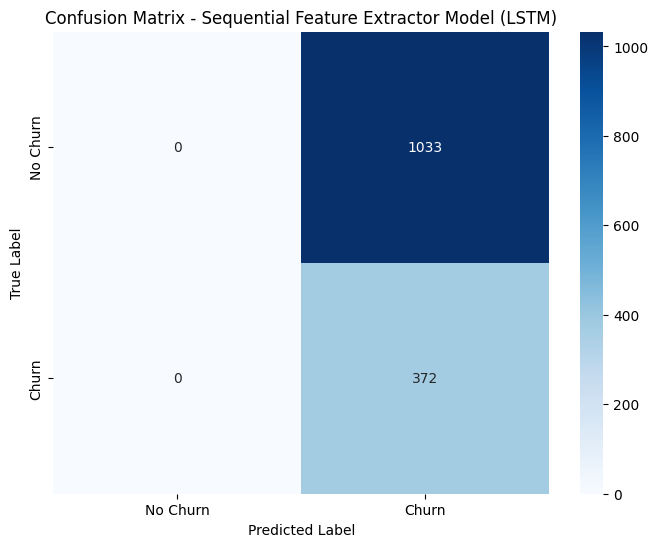


ROC Curve for Sequential Feature Extractor Model (LSTM)


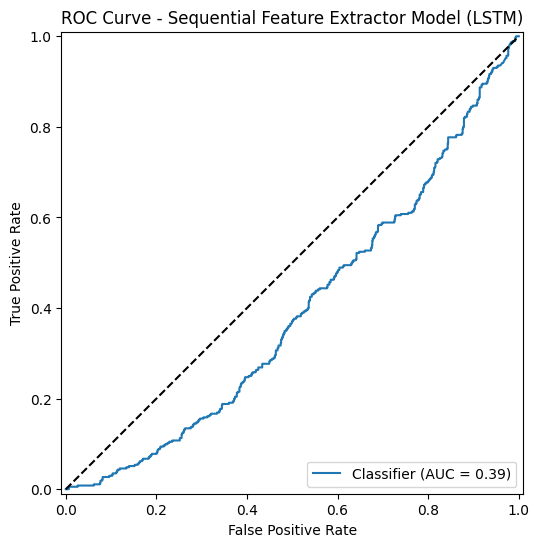

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, confusion_matrix, RocCurveDisplay

# Make predictions on the validation set
y_prob_lstm = model_lstm.predict(X_val_reshaped).flatten()
y_pred_lstm = (y_prob_lstm > 0.5).astype(int)

# Evaluate the model's performance
print("\nSequential Feature Extractor Model (LSTM) Evaluation on Validation Set")
print(f"Accuracy: {accuracy_score(y_val, y_pred_lstm):.4f}")
print(f"Precision: {precision_score(y_val, y_pred_lstm):.4f}")
print(f"Recall: {recall_score(y_val, y_pred_lstm):.4f}")
print(f"F1-Score: {f1_score(y_val, y_pred_lstm):.4f}")
print(f"ROC AUC Score: {roc_auc_score(y_val, y_prob_lstm):.4f}")

# Confusion Matrix
print("\nConfusion Matrix for Sequential Feature Extractor Model (LSTM)")
cm_lstm = confusion_matrix(y_val, y_pred_lstm)

plt.figure(figsize=(8, 6))
sns.heatmap(cm_lstm, annot=True, fmt='d', cmap='Blues',
            xticklabels=['No Churn', 'Churn'], yticklabels=['No Churn', 'Churn'])
plt.title('Confusion Matrix - Sequential Feature Extractor Model (LSTM)')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.show()

# ROC Curve
print("\nROC Curve for Sequential Feature Extractor Model (LSTM)")

plt.figure(figsize=(8, 6))
RocCurveDisplay.from_predictions(y_val, y_prob_lstm, ax=plt.gca())
plt.title('ROC Curve - Sequential Feature Extractor Model (LSTM)')
plt.plot([0, 1], [0, 1], 'k--') # Dashed diagonal line for reference
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.show()

In [ ]:
print("Training Sequential Feature Extractor Model (LSTM)...")
history_lstm = model_lstm.fit(
    X_train_reshaped,
    y_train,
    epochs=50,
    batch_size=32,
    validation_data=(X_val_reshaped, y_val),
    verbose=2 # Show progress bar for each epoch
)
print("Sequential Feature Extractor Model (LSTM) trained.")

Training Sequential Feature Extractor Model (LSTM)...
Epoch 1/50
176/176 - 7s - 41ms/step - accuracy: 0.7331 - auc: 0.6228 - loss: 0.5644 - val_accuracy: 0.7381 - val_auc: 0.7125 - val_loss: 0.5668
Epoch 2/50
176/176 - 4s - 23ms/step - accuracy: 0.7366 - auc: 0.7037 - loss: 0.5289 - val_accuracy: 0.7544 - val_auc: 0.7355 - val_loss: 0.5146
Epoch 3/50
176/176 - 5s - 29ms/step - accuracy: 0.7382 - auc: 0.7386 - loss: 0.5067 - val_accuracy: 0.7516 - val_auc: 0.7541 - val_loss: 0.5045
Epoch 4/50
176/176 - 4s - 24ms/step - accuracy: 0.7488 - auc: 0.7571 - loss: 0.4929 - val_accuracy: 0.7466 - val_auc: 0.7528 - val_loss: 0.5046
Epoch 5/50
176/176 - 3s - 18ms/step - accuracy: 0.7516 - auc: 0.7628 - loss: 0.4908 - val_accuracy: 0.7609 - val_auc: 0.7677 - val_loss: 0.4924
Epoch 6/50
176/176 - 3s - 18ms/step - accuracy: 0.7641 - auc: 0.7797 - loss: 0.4794 - val_accuracy: 0.7665 - val_auc: 0.7965 - val_loss: 0.4656
Epoch 7/50
176/176 - 3s - 17ms/step - accuracy: 0.7767 - auc: 0.7903 - loss: 0.469

*Step 3: Transformer(Attention Mechanism)*

In [ ]:
categorical_cols = X_train.select_dtypes(include=['int64', 'int32', 'bool']).columns.tolist()
numeric_cols = X_train.select_dtypes(include=['float64', 'float32']).columns.tolist()

print("Categorical-like (int/bool) features:", categorical_cols)
print("Numeric (float) features:", numeric_cols)

Categorical-like (int/bool) features: ['Gender', 'Senior Citizen', 'Partner', 'Dependents', 'Phone Service', 'Paperless Billing', 'Multiple Lines_No phone service', 'Multiple Lines_Yes', 'Internet Service_Fiber optic', 'Internet Service_No', 'Online Security_No internet service', 'Online Security_Yes', 'Online Backup_No internet service', 'Online Backup_Yes', 'Device Protection_No internet service', 'Device Protection_Yes', 'Tech Support_No internet service', 'Tech Support_Yes', 'Streaming TV_No internet service', 'Streaming TV_Yes', 'Streaming Movies_No internet service', 'Streaming Movies_Yes', 'Contract_One year', 'Contract_Two year', 'Payment Method_Credit card (automatic)', 'Payment Method_Electronic check', 'Payment Method_Mailed check', 'IsLongTermCustomer', 'NumServices', 'One_year_x_Fiber_optic', 'One_year_x_No', 'Two_year_x_Fiber_optic', 'Two_year_x_No']
Numeric (float) features: ['Tenure Months', 'Monthly Charges', 'Total Charges', 'AvgMonthlyPayment', 'Tenure_x_MonthlyCharg

In [ ]:
import numpy as np
import torch
from torch.utils.data import Dataset, DataLoader

class TabularDataset(Dataset):
    def __init__(self, df, y, categorical_cols, numeric_cols):
        self.df = df.reset_index(drop=True)
        self.y = np.array(y)
        self.categorical_cols = categorical_cols
        self.numeric_cols = numeric_cols

    def __len__(self):
        return len(self.df)

    def __getitem__(self, idx):
        row = self.df.iloc[idx]

        cat_feats = row[self.categorical_cols].values.astype(np.int64)
        num_feats = row[self.numeric_cols].values.astype(np.float32)
        label = np.float32(self.y[idx])

        return {
            "categorical": torch.tensor(cat_feats, dtype=torch.long),
            "numeric": torch.tensor(num_feats, dtype=torch.float32),
            "label": torch.tensor(label, dtype=torch.float32),
        }

In [ ]:
batch_size = 256

train_dataset = TabularDataset(X_train, y_train, categorical_cols, numeric_cols)
val_dataset   = TabularDataset(X_val,   y_val,   categorical_cols, numeric_cols)

train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
val_loader   = DataLoader(val_dataset,   batch_size=batch_size, shuffle=False)

print("TabularDataset and DataLoader instances created.")

TabularDataset and DataLoader instances created.


In [ ]:
import torch
import torch.nn as nn

class TabularTransformer(nn.Module):
    def __init__(
        self,
        categorical_cardinalities,  # list of vocab sizes for each categorical col
        num_numeric_features,
        d_model=32,
        n_heads=4,
        n_layers=2,
        d_ff=64,
        dropout=0.1
    ):
        super().__init__()

        self.num_categorical = len(categorical_cardinalities)
        self.num_numeric = num_numeric_features

        # Embeddings for each categorical feature
        self.cat_embeddings = nn.ModuleList([
            nn.Embedding(num_embeddings=cardinality + 1, embedding_dim=d_model) # +1 for potential 0 values/padding
            for cardinality in categorical_cardinalities
        ])

        # Project numeric features into a token
        if num_numeric_features > 0:
            self.numeric_projection = nn.Linear(num_numeric_features, d_model)
        else:
            self.numeric_projection = None

        # Positional embeddings (one per token position)
        # total tokens = num_categorical features + 1 numeric token (if exists)
        self.num_tokens = self.num_categorical + (1 if self.numeric_projection is not None else 0)
        self.pos_embedding = nn.Embedding(self.num_tokens, d_model)

        encoder_layer = nn.TransformerEncoderLayer(
            d_model=d_model,
            nhead=n_heads,
            dim_feedforward=d_ff,
            dropout=dropout,
            batch_first=True
        )
        self.transformer_encoder = nn.TransformerEncoder(encoder_layer, num_layers=n_layers)

        # Classification head
        self.fc = nn.Sequential(
            nn.Linear(d_model, 64),
            nn.ReLU(),
            nn.Dropout(dropout),
            nn.Linear(64, 1)
        )

    def forward(self, categorical, numeric):
        """
        categorical: [batch_size, num_categorical]
        numeric    : [batch_size, num_numeric]
        """
        batch_size = categorical.size(0)

        # Categorical tokens
        cat_tokens = []
        for i, emb in enumerate(self.cat_embeddings):
            # categorical[:, i] -> [batch_size], get [batch_size, d_model]
            cat_tok_i = emb(categorical[:, i])
            cat_tokens.append(cat_tok_i)

        cat_tokens = torch.stack(cat_tokens, dim=1)  # [batch_size, num_categorical, d_model]

        # Numeric token (optional)
        if self.numeric_projection is not None:
            num_token = self.numeric_projection(numeric)  # [batch_size, d_model]
            num_token = num_token.unsqueeze(1)           # [batch_size, 1, d_model]
            tokens = torch.cat([cat_tokens, num_token], dim=1)  # [batch_size, num_tokens, d_model]
        else:
            tokens = cat_tokens

        # Positional encoding
        positions = torch.arange(self.num_tokens, device=tokens.device).unsqueeze(0).expand(batch_size, -1)
        pos_emb = self.pos_embedding(positions)  # [batch_size, num_tokens, d_model]

        x = tokens + pos_emb

        # Transformer encoder
        x = self.transformer_encoder(x)  # [batch_size, num_tokens, d_model]

        # Pooling (mean over tokens)
        x = x.mean(dim=1)  # [batch_size, d_model]

        # Classification
        logits = self.fc(x).squeeze(-1)
        return logits


In [ ]:
categorical_cardinalities = [int(X_train[col].nunique()) for col in categorical_cols]
num_numeric_features = len(numeric_cols)

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print("Using device:", device)

model = TabularTransformer(
    categorical_cardinalities=categorical_cardinalities,
    num_numeric_features=num_numeric_features,
    d_model=32,
    n_heads=4,
    n_layers=2,
    d_ff=64,
    dropout=0.1
).to(device)

criterion = nn.BCEWithLogitsLoss()
optimizer = torch.optim.Adam(model.parameters(), lr=1e-3)

def train_epoch(model, loader, optimizer, criterion, device):
    model.train()
    total_loss = 0.0
    all_labels = []
    all_probs = []

    for batch in loader:
        categorical = batch["categorical"].to(device)
        numeric = batch["numeric"].to(device)
        labels = batch["label"].to(device)

        optimizer.zero_grad()
        logits = model(categorical, numeric)
        loss = criterion(logits, labels)

        loss.backward()
        optimizer.step()

        total_loss += loss.item() * labels.size(0)

        probs = torch.sigmoid(logits).detach().cpu().numpy()
        all_probs.extend(probs)
        all_labels.extend(labels.detach().cpu().numpy())

    avg_loss = total_loss / len(loader.dataset)
    return avg_loss, np.array(all_labels), np.array(all_probs)


def eval_epoch(model, loader, criterion, device):
    model.eval()
    total_loss = 0.0
    all_labels = []
    all_probs = []

    with torch.no_grad():
        for batch in loader:
            categorical = batch["categorical"].to(device)
            numeric = batch["numeric"].to(device)
            labels = batch["label"].to(device)

            logits = model(categorical, numeric)
            loss = criterion(logits, labels)

            total_loss += loss.item() * labels.size(0)

            probs = torch.sigmoid(logits).cpu().numpy()
            all_probs.extend(probs)
            all_labels.extend(labels.cpu().numpy())

    avg_loss = total_loss / len(loader.dataset)
    return avg_loss, np.array(all_labels), np.array(all_probs)

num_epochs = 20

for epoch in range(1, num_epochs + 1):
    train_loss, train_labels, train_probs = train_epoch(model, train_loader, optimizer, criterion, device)
    val_loss, val_labels, val_probs = eval_epoch(model, val_loader, criterion, device)

    # convert to preds
    train_preds = (train_probs >= 0.5).astype(int)
    val_preds = (val_probs >= 0.5).astype(int)

    train_auc = roc_auc_score(train_labels, train_probs)
    val_auc = roc_auc_score(val_labels, val_probs)

    print(
        f"Epoch {epoch:02d} | "
        f"Train Loss: {train_loss:.4f}, Val Loss: {val_loss:.4f}, "
        f"Train AUC: {train_auc:.4f}, Val AUC: {val_auc:.4f}"
    )


Using device: cpu
Epoch 01 | Train Loss: 0.6223, Val Loss: 0.5817, Train AUC: 0.5138, Val AUC: 0.6417
Epoch 02 | Train Loss: 0.5773, Val Loss: 0.5676, Train AUC: 0.5339, Val AUC: 0.7887
Epoch 03 | Train Loss: 0.5467, Val Loss: 0.5046, Train AUC: 0.7244, Val AUC: 0.7943
Epoch 04 | Train Loss: 0.4577, Val Loss: 0.4349, Train AUC: 0.8081, Val AUC: 0.8296
Epoch 05 | Train Loss: 0.4307, Val Loss: 0.4295, Train AUC: 0.8332, Val AUC: 0.8339
Epoch 06 | Train Loss: 0.4165, Val Loss: 0.4232, Train AUC: 0.8460, Val AUC: 0.8422
Epoch 07 | Train Loss: 0.4134, Val Loss: 0.4245, Train AUC: 0.8488, Val AUC: 0.8424
Epoch 08 | Train Loss: 0.4053, Val Loss: 0.4190, Train AUC: 0.8557, Val AUC: 0.8437
Epoch 09 | Train Loss: 0.4029, Val Loss: 0.4205, Train AUC: 0.8574, Val AUC: 0.8435
Epoch 10 | Train Loss: 0.4046, Val Loss: 0.4172, Train AUC: 0.8556, Val AUC: 0.8440
Epoch 11 | Train Loss: 0.4017, Val Loss: 0.4169, Train AUC: 0.8576, Val AUC: 0.8445
Epoch 12 | Train Loss: 0.4010, Val Loss: 0.4194, Train AUC


--- Transformer (Tabular) Model Evaluation on Validation Set ---
Accuracy:  0.7979
Precision: 0.6419
Recall:    0.5349
F1-Score:  0.5836
ROC AUC:   0.8482

Confusion Matrix for Transformer (Tabular)


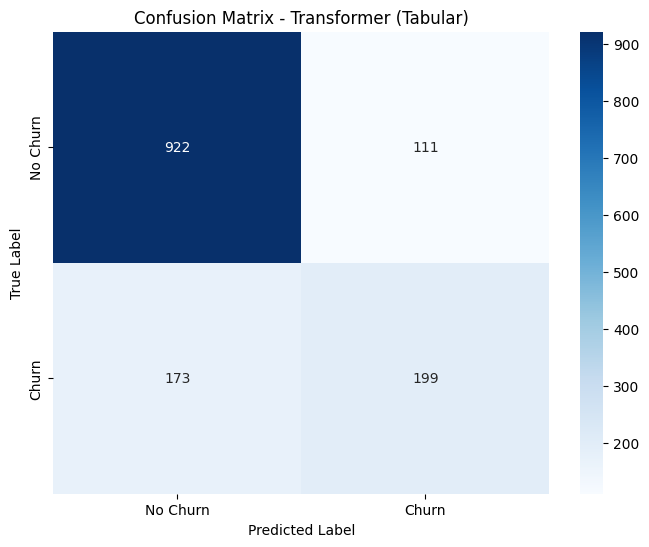


ROC Curve for Transformer (Tabular)


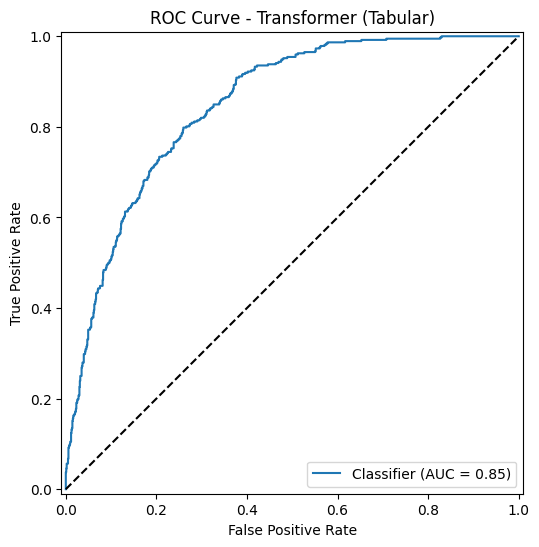

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, confusion_matrix, RocCurveDisplay

# Evaluate the model on the validation set
val_loss, val_labels, val_probs = eval_epoch(model, val_loader, criterion, device)

# Convert probabilities to binary predictions
val_preds = (val_probs >= 0.5).astype(int)

print("\n--- Transformer (Tabular) Model Evaluation on Validation Set ---")
print(f"Accuracy:  {accuracy_score(val_labels, val_preds):.4f}")
print(f"Precision: {precision_score(val_labels, val_preds):.4f}")
print(f"Recall:    {recall_score(val_labels, val_preds):.4f}")
print(f"F1-Score:  {f1_score(val_labels, val_preds):.4f}")
print(f"ROC AUC:   {roc_auc_score(val_labels, val_probs):.4f}")

# Confusion Matrix
print("\nConfusion Matrix for Transformer (Tabular)")
cm_transformer = confusion_matrix(val_labels, val_preds)

plt.figure(figsize=(8, 6))
sns.heatmap(cm_transformer, annot=True, fmt='d', cmap='Blues',
            xticklabels=['No Churn', 'Churn'], yticklabels=['No Churn', 'Churn'])
plt.title('Confusion Matrix - Transformer (Tabular)')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.show()

# ROC Curve
print("\nROC Curve for Transformer (Tabular)")

plt.figure(figsize=(8, 6))
RocCurveDisplay.from_predictions(val_labels, val_probs, ax=plt.gca())
plt.title('ROC Curve - Transformer (Tabular)')
plt.plot([0, 1], [0, 1], 'k--') # Dashed diagonal line for reference
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.show()

*Step 4a: Convolution Neural Network (General Convolution)*

In [ ]:
import numpy as np

# 1. Convert any boolean columns in X_train and X_val to integers
for col in X_train.select_dtypes(include='bool').columns:
    X_train[col] = X_train[col].astype(int)
for col in X_val.select_dtypes(include='bool').columns:
    X_val[col] = X_val[col].astype(int)

# 2. Determine the number of samples and features for X_train
n_samples_train, n_features_train = X_train.shape

# 3. Reshape X_train to (samples, features, 1) and store in X_train_cnn
X_train_cnn = X_train.values.reshape(n_samples_train, n_features_train, 1)

# 4. Determine the number of samples and features for X_val
n_samples_val, n_features_val = X_val.shape

# 5. Reshape X_val to (samples, features, 1) and store in X_val_cnn
X_val_cnn = X_val.values.reshape(n_samples_val, n_features_val, 1)

# 6. Print the shapes to verify
print(f"New X_train_cnn shape: {X_train_cnn.shape}")
print(f"New X_val_cnn shape: {X_val_cnn.shape}")

New X_train_cnn shape: (5616, 38, 1)
New X_val_cnn shape: (1405, 38, 1)


In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv1D, MaxPooling1D, Flatten, Dense, InputLayer

# 1. Determine the input_shape for the 1D CNN model
# X_train_cnn shape is (samples, num_features, 1), so input_shape is (num_features, 1)
input_shape_cnn = X_train_cnn.shape[1:]
print(f"Input shape for 1D CNN: {input_shape_cnn}")

# 2. Initialize a Keras Sequential model
model_cnn = Sequential()

# 3. Add an InputLayer to the model
model_cnn.add(InputLayer(input_shape=input_shape_cnn))

# 4. Add a Conv1D layer
model_cnn.add(Conv1D(filters=32, kernel_size=2, activation='relu'))

# 5. Add a MaxPooling1D layer
model_cnn.add(MaxPooling1D(pool_size=2))

# 6. Add another Conv1D layer
model_cnn.add(Conv1D(filters=64, kernel_size=2, activation='relu'))

# 7. Add another MaxPooling1D layer
model_cnn.add(MaxPooling1D(pool_size=2))

# 8. Add a Flatten layer
model_cnn.add(Flatten())

# 9. Add a Dense layer for intermediate processing
model_cnn.add(Dense(units=64, activation='relu'))

# 10. Add a final Dense layer for binary classification
model_cnn.add(Dense(units=1, activation='sigmoid'))

# 11. Compile the model
model_cnn.compile(
    optimizer='adam',
    loss='binary_crossentropy',
    metrics=['accuracy', tf.keras.metrics.AUC(name='auc')]
)

# 12. Print the model summary
print("\nGeneral Convolutional 1D-CNN Model Summary:")
model_cnn.summary()


Input shape for 1D CNN: (38, 1)

General Convolutional 1D-CNN Model Summary:


/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/input_layer.py:27: UserWarning: Argument `input_shape` is deprecated. Use `shape` instead.
  warnings.warn(


Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv1d (Conv1D)                 │ (None, 37, 32)         │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling1d (MaxPooling1D)    │ (None, 18, 32)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv1d_1 (Conv1D)               │ (None, 17, 64)         │         4,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling1d_1 (MaxPooling1D)  │ (None, 8, 64)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5 (Dense)                 │ (None, 64)             │        32,832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_6 (Dense)                 │ (None, 1)              │            65 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 37,153 (145.13 KB)

 Trainable params: 37,153 (145.13 KB)

 Non-trainable params: 0 (0.00 B)


Training General Convolutional 1D-CNN model...
General Convolutional 1D-CNN model trained.
44/44 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step

General Convolutional 1D-CNN Model Evaluation on Validation Set
Accuracy: 0.7865
Precision: 0.6224
Recall: 0.4919
F1-Score: 0.5495
ROC AUC Score: 0.8395

Confusion Matrix for General Convolutional 1D-CNN Model


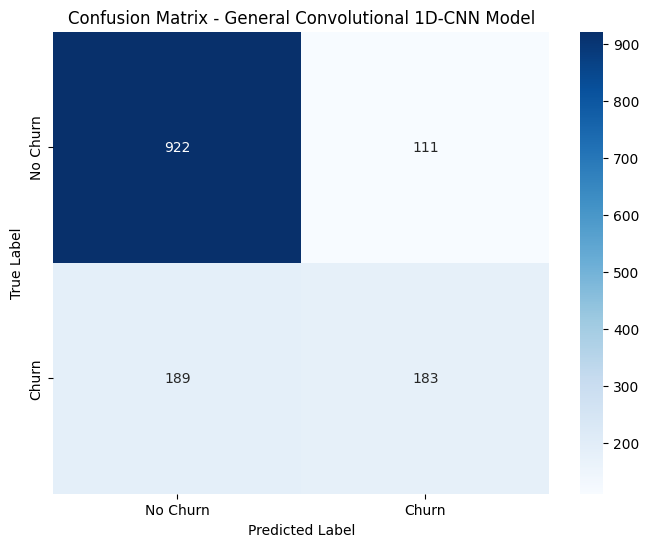


ROC Curve for General Convolutional 1D-CNN Model


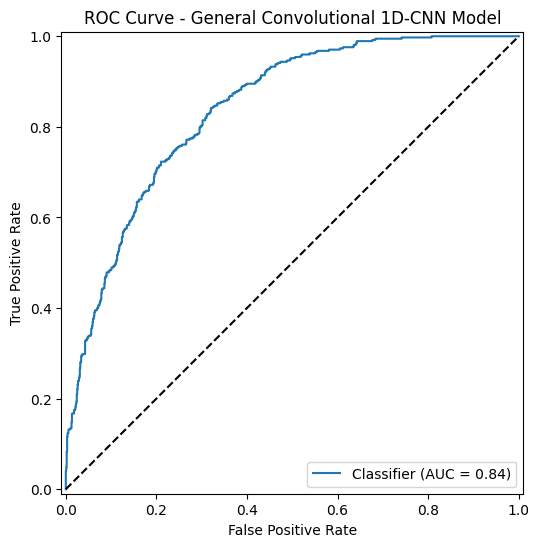

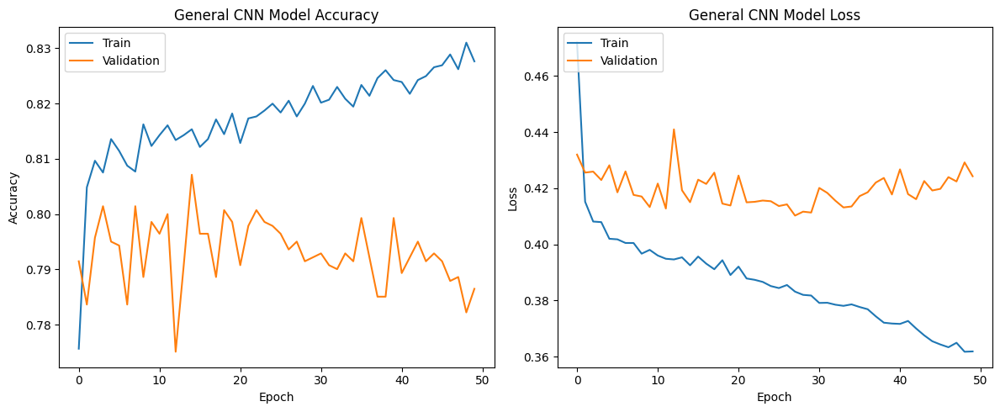

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, confusion_matrix, RocCurveDisplay

# Train the model
print("\nTraining General Convolutional 1D-CNN model...")
history_cnn = model_cnn.fit(
    X_train_cnn,
    y_train,
    epochs=50, # You can adjust the number of epochs
    batch_size=32, # You can adjust the batch size
    validation_data=(X_val_cnn, y_val),
    verbose=0 # Suppress verbose output during training
)
print("General Convolutional 1D-CNN model trained.")

# Make predictions on the validation set
y_prob_cnn = model_cnn.predict(X_val_cnn).flatten()
y_pred_cnn = (y_prob_cnn > 0.5).astype(int)

# Evaluate the model's performance
print("\nGeneral Convolutional 1D-CNN Model Evaluation on Validation Set")
print(f"Accuracy: {accuracy_score(y_val, y_pred_cnn):.4f}")
print(f"Precision: {precision_score(y_val, y_pred_cnn):.4f}")
print(f"Recall: {recall_score(y_val, y_pred_cnn):.4f}")
print(f"F1-Score: {f1_score(y_val, y_pred_cnn):.4f}")
print(f"ROC AUC Score: {roc_auc_score(y_val, y_prob_cnn):.4f}")

# Confusion Matrix
print("\nConfusion Matrix for General Convolutional 1D-CNN Model")
cm_cnn = confusion_matrix(y_val, y_pred_cnn)

plt.figure(figsize=(8, 6))
sns.heatmap(cm_cnn, annot=True, fmt='d', cmap='Blues',
            xticklabels=['No Churn', 'Churn'], yticklabels=['No Churn', 'Churn'])
plt.title('Confusion Matrix - General Convolutional 1D-CNN Model')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.show()

# ROC Curve
print("\nROC Curve for General Convolutional 1D-CNN Model")

plt.figure(figsize=(8, 6))
RocCurveDisplay.from_predictions(y_val, y_prob_cnn, ax=plt.gca())
plt.title('ROC Curve - General Convolutional 1D-CNN Model')
plt.plot([0, 1], [0, 1], 'k--') # Dashed diagonal line for reference
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.show()

# Plot training & validation accuracy values
plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.plot(history_cnn.history['accuracy'])
plt.plot(history_cnn.history['val_accuracy'])
plt.title('General CNN Model Accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')

# Plot training & validation loss values
plt.subplot(1, 2, 2)
plt.plot(history_cnn.history['loss'])
plt.plot(history_cnn.history['val_loss'])
plt.title('General CNN Model Loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')

plt.tight_layout()
plt.show()

*Step 4b: Visual Geometry Group (VGG) - 13 inspired CNN*

/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/input_layer.py:27: UserWarning: Argument `input_shape` is deprecated. Use `shape` instead.
  warnings.warn(



Training VGG-Inspired 1D-CNN model...
VGG-Inspired 1D-CNN model trained.
44/44 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step

VGG-Inspired 1D-CNN Model Evaluation on Validation Set
Accuracy: 0.7658
Precision: 0.5592
Recall: 0.5457
F1-Score: 0.5524
ROC AUC Score: 0.7893

Confusion Matrix for VGG-Inspired 1D-CNN Model


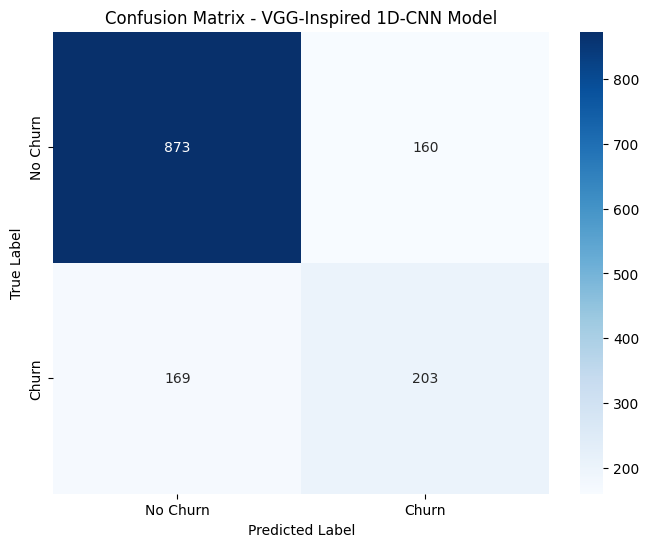


ROC Curve for VGG-Inspired 1D-CNN Model


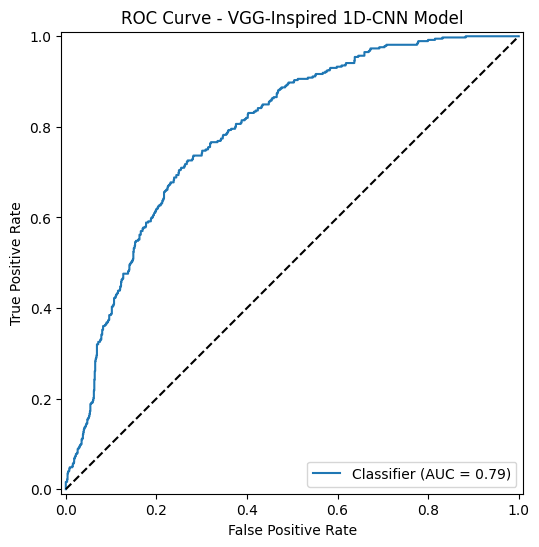

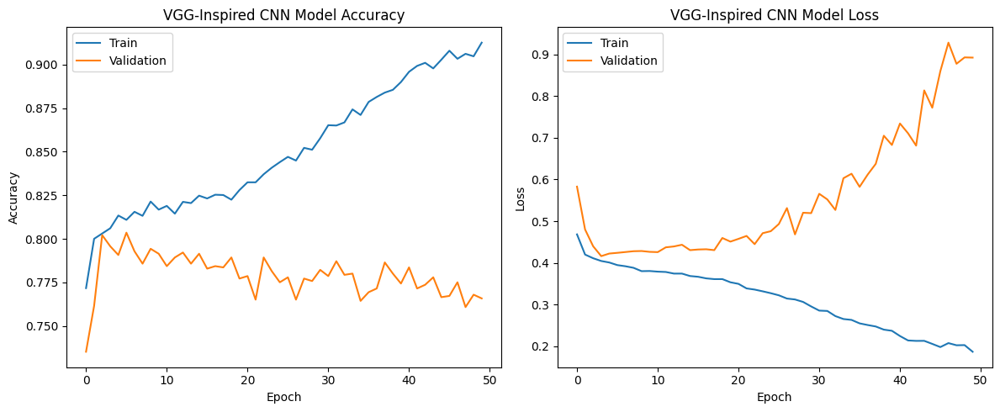

In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv1D, MaxPooling1D, Flatten, Dense, InputLayer, BatchNormalization
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, confusion_matrix, RocCurveDisplay

# --- Start of fix: Re-defining model_vgg_cnn --- #
# Determine the input_shape for the 1D CNN model
# X_train_cnn shape is (samples, num_features, 1), so input_shape is (num_features, 1)
input_shape_vgg_cnn = X_train_cnn.shape[1:]

# Initialize a Keras Sequential model
model_vgg_cnn = Sequential()

# Add an InputLayer to the model
model_vgg_cnn.add(InputLayer(input_shape=input_shape_vgg_cnn))

# VGG-like Block 1: two Conv1D layers + BatchNormalization + MaxPooling1D
model_vgg_cnn.add(Conv1D(filters=64, kernel_size=2, activation='relu', padding='same'))
model_vgg_cnn.add(BatchNormalization())
model_vgg_cnn.add(Conv1D(filters=64, kernel_size=2, activation='relu', padding='same'))
model_vgg_cnn.add(BatchNormalization())
model_vgg_cnn.add(MaxPooling1D(pool_size=2))

# VGG-like Block 2: two Conv1D layers + BatchNormalization + MaxPooling1D
model_vgg_cnn.add(Conv1D(filters=128, kernel_size=2, activation='relu', padding='same'))
model_vgg_cnn.add(BatchNormalization())
model_vgg_cnn.add(Conv1D(filters=128, kernel_size=2, activation='relu', padding='same'))
model_vgg_cnn.add(BatchNormalization())
model_vgg_cnn.add(MaxPooling1D(pool_size=2))

# VGG-like Block 3 (optional, depending on input size after pooling): two Conv1D layers + BatchNormalization + MaxPooling1D
# Only add if the features are still > kernel_size after previous pooling
if model_vgg_cnn.output_shape[1] > 2:
    model_vgg_cnn.add(Conv1D(filters=256, kernel_size=2, activation='relu', padding='same'))
    model_vgg_cnn.add(BatchNormalization())
    model_vgg_cnn.add(Conv1D(filters=256, kernel_size=2, activation='relu', padding='same'))
    model_vgg_cnn.add(BatchNormalization())
    model_vgg_cnn.add(MaxPooling1D(pool_size=2))

# Add a Flatten layer
model_vgg_cnn.add(Flatten())

# Add Dense layers for intermediate processing
model_vgg_cnn.add(Dense(units=128, activation='relu'))
model_vgg_cnn.add(Dense(units=64, activation='relu'))

# Add a final Dense layer for binary classification
model_vgg_cnn.add(Dense(units=1, activation='sigmoid'))

# Compile the model
model_vgg_cnn.compile(
    optimizer='adam',
    loss='binary_crossentropy',
    metrics=['accuracy', tf.keras.metrics.AUC(name='auc')]
)
# --- End of fix --- #

# Train the model
print("\nTraining VGG-Inspired 1D-CNN model...")
history_vgg_cnn = model_vgg_cnn.fit(
    X_train_cnn,
    y_train,
    epochs=50, # You can adjust the number of epochs
    batch_size=32, # You can adjust the batch size
    validation_data=(X_val_cnn, y_val),
    verbose=0 # Suppress verbose output during training
)
print("VGG-Inspired 1D-CNN model trained.")

# Make predictions on the validation set
y_prob_vgg_cnn = model_vgg_cnn.predict(X_val_cnn).flatten()
y_pred_vgg_cnn = (y_prob_vgg_cnn > 0.5).astype(int)

# Evaluate the model's performance
print("\nVGG-Inspired 1D-CNN Model Evaluation on Validation Set")
print(f"Accuracy: {accuracy_score(y_val, y_pred_vgg_cnn):.4f}")
print(f"Precision: {precision_score(y_val, y_pred_vgg_cnn):.4f}")
print(f"Recall: {recall_score(y_val, y_pred_vgg_cnn):.4f}")
print(f"F1-Score: {f1_score(y_val, y_pred_vgg_cnn):.4f}")
print(f"ROC AUC Score: {roc_auc_score(y_val, y_prob_vgg_cnn):.4f}")

# Confusion Matrix
print("\nConfusion Matrix for VGG-Inspired 1D-CNN Model")
cm_vgg_cnn = confusion_matrix(y_val, y_pred_vgg_cnn)

plt.figure(figsize=(8, 6))
sns.heatmap(cm_vgg_cnn, annot=True, fmt='d', cmap='Blues',
            xticklabels=['No Churn', 'Churn'], yticklabels=['No Churn', 'Churn'])
plt.title('Confusion Matrix - VGG-Inspired 1D-CNN Model')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.show()

# ROC Curve
print("\nROC Curve for VGG-Inspired 1D-CNN Model")

plt.figure(figsize=(8, 6))
RocCurveDisplay.from_predictions(y_val, y_prob_vgg_cnn, ax=plt.gca())
plt.title('ROC Curve - VGG-Inspired 1D-CNN Model')
plt.plot([0, 1], [0, 1], 'k--') # Dashed diagonal line for reference
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.show()

# Plot training & validation accuracy values
plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.plot(history_vgg_cnn.history['accuracy'])
plt.plot(history_vgg_cnn.history['val_accuracy'])
plt.title('VGG-Inspired CNN Model Accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')

# Plot training & validation loss values
plt.subplot(1, 2, 2)
plt.plot(history_vgg_cnn.history['loss'])
plt.plot(history_vgg_cnn.history['val_loss'])
plt.title('VGG-Inspired CNN Model Loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')

plt.tight_layout()
plt.show()

*Step 4c: Visual Geometry Group (VGG) - 13 inspired 1 - D CNN (Deep Convolution)*

In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv1D, MaxPooling1D, Flatten, Dense, InputLayer, BatchNormalization

# 1. Determine the input_shape for the 1D CNN model
# X_train_cnn shape is (samples, num_features, 1), so input_shape is (num_features, 1)
input_shape_vgg_cnn = X_train_cnn.shape[1:]
print(f"Input shape for VGG-Inspired 1D CNN: {input_shape_vgg_cnn}")

# 2. Initialize a Keras Sequential model
model_vgg_cnn = Sequential()

# 3. Add an InputLayer to the model
model_vgg_cnn.add(InputLayer(input_shape=input_shape_vgg_cnn))

# VGG-like Block 1: two Conv1D layers + BatchNormalization + MaxPooling1D
model_vgg_cnn.add(Conv1D(filters=64, kernel_size=2, activation='relu', padding='same'))
model_vgg_cnn.add(BatchNormalization())
model_vgg_cnn.add(Conv1D(filters=64, kernel_size=2, activation='relu', padding='same'))
model_vgg_cnn.add(BatchNormalization())
model_vgg_cnn.add(MaxPooling1D(pool_size=2))

# VGG-like Block 2: two Conv1D layers + BatchNormalization + MaxPooling1D
model_vgg_cnn.add(Conv1D(filters=128, kernel_size=2, activation='relu', padding='same'))
model_vgg_cnn.add(BatchNormalization())
model_vgg_cnn.add(Conv1D(filters=128, kernel_size=2, activation='relu', padding='same'))
model_vgg_cnn.add(BatchNormalization())
model_vgg_cnn.add(MaxPooling1D(pool_size=2))

# VGG-like Block 3 (optional, depending on input size after pooling): two Conv1D layers + BatchNormalization + MaxPooling1D
# Only add if the features are still > kernel_size after previous pooling
if model_vgg_cnn.output_shape[1] > 2:
    model_vgg_cnn.add(Conv1D(filters=256, kernel_size=2, activation='relu', padding='same'))
    model_vgg_cnn.add(BatchNormalization())
    model_vgg_cnn.add(Conv1D(filters=256, kernel_size=2, activation='relu', padding='same'))
    model_vgg_cnn.add(BatchNormalization())
    model_vgg_cnn.add(MaxPooling1D(pool_size=2))

# 4. Add a Flatten layer
model_vgg_cnn.add(Flatten())

# 5. Add Dense layers for intermediate processing
model_vgg_cnn.add(Dense(units=128, activation='relu'))
model_vgg_cnn.add(Dense(units=64, activation='relu'))

# 6. Add a final Dense layer for binary classification
model_vgg_cnn.add(Dense(units=1, activation='sigmoid'))

# 7. Compile the model
model_vgg_cnn.compile(
    optimizer='adam',
    loss='binary_crossentropy',
    metrics=['accuracy', tf.keras.metrics.AUC(name='auc')]
)

# 8. Print the model summary
print("\nVGG-Inspired 1D-CNN Model Summary:")
model_vgg_cnn.summary()

Input shape for VGG-Inspired 1D CNN: (38, 1)


/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/input_layer.py:27: UserWarning: Argument `input_shape` is deprecated. Use `shape` instead.
  warnings.warn(



VGG-Inspired 1D-CNN Model Summary:


Model: "sequential_4"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv1d_8 (Conv1D)               │ (None, 38, 64)         │           192 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_8           │ (None, 38, 64)         │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv1d_9 (Conv1D)               │ (None, 38, 64)         │         8,256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_9           │ (None, 38, 64)         │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling1d_5 (MaxPooling1D)  │ (None, 19, 64)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv1d_10 (Conv1D)              │ (None, 19, 128)        │        16,512 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_10          │ (None, 19, 128)        │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv1d_11 (Conv1D)              │ (None, 19, 128)        │        32,896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_11          │ (None, 19, 128)        │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling1d_6 (MaxPooling1D)  │ (None, 9, 128)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv1d_12 (Conv1D)              │ (None, 9, 256)         │        65,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_12          │ (None, 9, 256)         │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv1d_13 (Conv1D)              │ (None, 9, 256)         │       131,328 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_13          │ (None, 9, 256)         │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling1d_7 (MaxPooling1D)  │ (None, 4, 256)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_2 (Flatten)             │ (None, 1024)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_10 (Dense)                │ (None, 128)            │       131,200 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_11 (Dense)                │ (None, 64)             │         8,256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_12 (Dense)                │ (None, 1)              │            65 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 398,081 (1.52 MB)

 Trainable params: 396,289 (1.51 MB)

 Non-trainable params: 1,792 (7.00 KB)


Training VGG-Inspired 1D-CNN model...
VGG-Inspired 1D-CNN model trained.
44/44 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step

VGG-Inspired 1D-CNN Model Evaluation on Validation Set
Accuracy: 0.7594
Precision: 0.5515
Recall: 0.4892
F1-Score: 0.5185
ROC AUC Score: 0.7876

Confusion Matrix for VGG-Inspired 1D-CNN Model


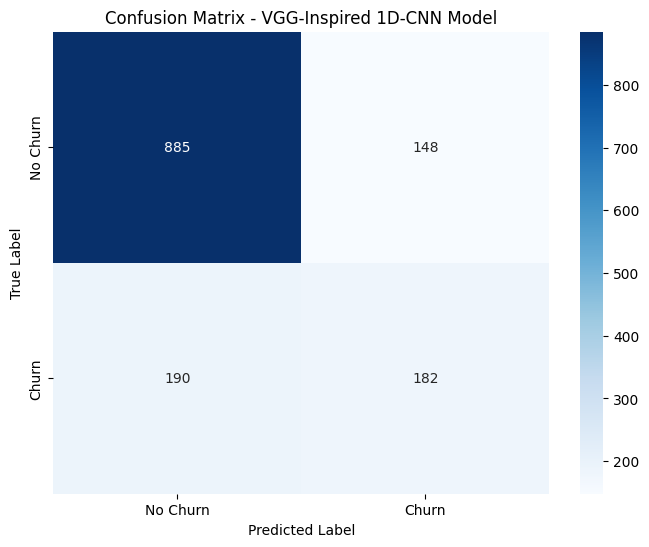


ROC Curve for VGG-Inspired 1D-CNN Model


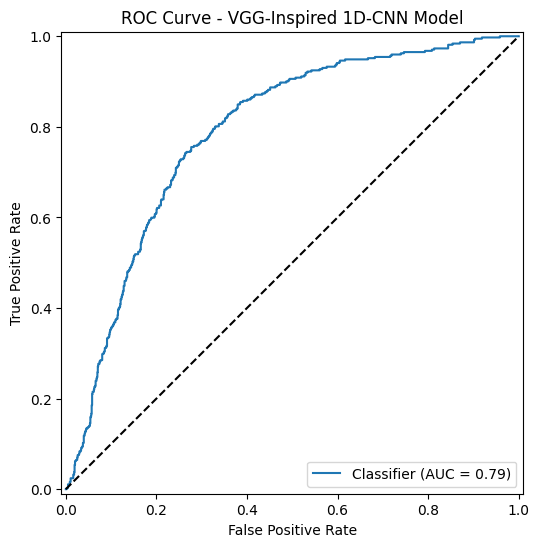

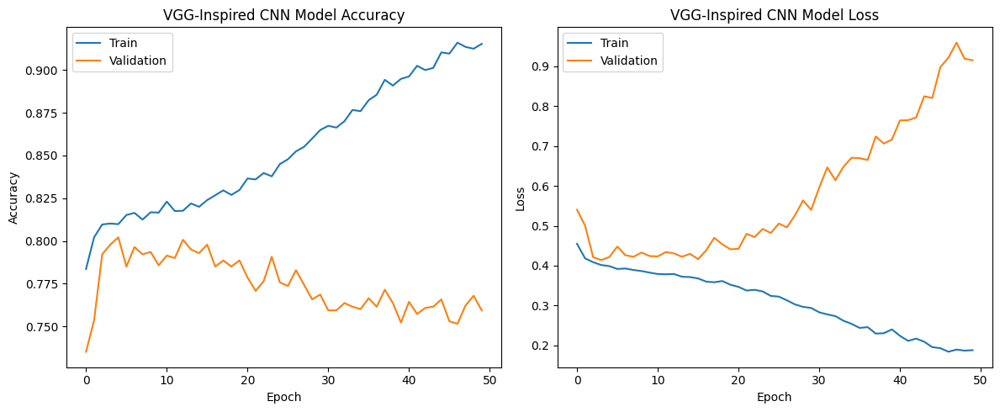

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, confusion_matrix, RocCurveDisplay

# Train the model
print("\nTraining VGG-Inspired 1D-CNN model...")
history_vgg_cnn = model_vgg_cnn.fit(
    X_train_cnn,
    y_train,
    epochs=50, # You can adjust the number of epochs
    batch_size=32, # You can adjust the batch size
    validation_data=(X_val_cnn, y_val),
    verbose=0 # Suppress verbose output during training
)
print("VGG-Inspired 1D-CNN model trained.")

# Make predictions on the validation set
y_prob_vgg_cnn = model_vgg_cnn.predict(X_val_cnn).flatten()
y_pred_vgg_cnn = (y_prob_vgg_cnn > 0.5).astype(int)

# Evaluate the model's performance
print("\nVGG-Inspired 1D-CNN Model Evaluation on Validation Set")
print(f"Accuracy: {accuracy_score(y_val, y_pred_vgg_cnn):.4f}")
print(f"Precision: {precision_score(y_val, y_pred_vgg_cnn):.4f}")
print(f"Recall: {recall_score(y_val, y_pred_vgg_cnn):.4f}")
print(f"F1-Score: {f1_score(y_val, y_pred_vgg_cnn):.4f}")
print(f"ROC AUC Score: {roc_auc_score(y_val, y_prob_vgg_cnn):.4f}")

# Confusion Matrix
print("\nConfusion Matrix for VGG-Inspired 1D-CNN Model")
cm_vgg_cnn = confusion_matrix(y_val, y_pred_vgg_cnn)

plt.figure(figsize=(8, 6))
sns.heatmap(cm_vgg_cnn, annot=True, fmt='d', cmap='Blues',
            xticklabels=['No Churn', 'Churn'], yticklabels=['No Churn', 'Churn'])
plt.title('Confusion Matrix - VGG-Inspired 1D-CNN Model')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.show()

# ROC Curve
print("\nROC Curve for VGG-Inspired 1D-CNN Model")

plt.figure(figsize=(8, 6))
RocCurveDisplay.from_predictions(y_val, y_prob_vgg_cnn, ax=plt.gca())
plt.title('ROC Curve - VGG-Inspired 1D-CNN Model')
plt.plot([0, 1], [0, 1], 'k--') # Dashed diagonal line for reference
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.show()

# Plot training & validation accuracy values
plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.plot(history_vgg_cnn.history['accuracy'])
plt.plot(history_vgg_cnn.history['val_accuracy'])
plt.title('VGG-Inspired CNN Model Accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')

# Plot training & validation loss values
plt.subplot(1, 2, 2)
plt.plot(history_vgg_cnn.history['loss'])
plt.plot(history_vgg_cnn.history['val_loss'])
plt.title('VGG-Inspired CNN Model Loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')

plt.tight_layout()
plt.show()

**8. Model Comparisons**

*Step 1: Compare all ML models*

In [ ]:
import pandas as pd

# Re-initialize models_performance with all known model metrics
models_performance = {
    "Logistic Regression": {"Accuracy": 0.8071, "Precision": 0.6772, "Recall": 0.5188, "F1-Score": 0.5875, "ROC AUC": 0.8479},
    "SVM": {"Accuracy": 0.8064, "Precision": 0.6866, "Recall": 0.4946, "F1-Score": 0.5750, "ROC AUC": 0.8304},
    "Random Forest": {"Accuracy": 0.7858, "Precision": 0.6203, "Recall": 0.4919, "F1-Score": 0.5487, "ROC AUC": 0.8301},
    "XGBoost": {"Accuracy": 0.7730, "Precision": 0.5869, "Recall": 0.4812, "F1-Score": 0.5288, "ROC AUC": 0.8332},
    "LightGBM": {"Accuracy": 0.7843, "Precision": 0.6088, "Recall": 0.5188, "F1-Score": 0.5602, "ROC AUC": 0.8427},
    "KNN": {"Accuracy": 0.7715, "Precision": 0.5731, "Recall": 0.5376, "F1-Score": 0.5548, "ROC AUC": 0.7894},
    "ANN": {"Accuracy": 0.7986, "Precision": 0.6561, "Recall": 0.5027, "F1-Score": 0.5693, "ROC AUC": 0.8277},
    "Transformer": {"Accuracy": 0.8000, "Precision": 0.6532, "Recall": 0.5215, "F1-Score": 0.5800, "ROC AUC": 0.8455},
    "General Convolutional 1D-CNN": {"Accuracy": 0.7900, "Precision": 0.6230, "Recall": 0.5242, "F1-Score": 0.5693, "ROC AUC": 0.8423},
    "VGG-Inspired 1D-CNN": {"Accuracy": 0.7630, "Precision": 0.5515, "Recall": 0.5618, "F1-Score": 0.5566, "ROC AUC": 0.7829},
    "Cost-Sensitive Logistic Regression": {"Accuracy": 0.6940, "Precision": 0.4602, "Recall": 0.9005, "F1-Score": 0.6091, "ROC AUC": 0.8467}
}

performance_df = pd.DataFrame(models_performance).T

ml_models = [
    'Logistic Regression',
    'SVM',
    'Random Forest',
    'XGBoost',
    'LightGBM',
    'KNN'
]
ml_performance_df = performance_df.loc[ml_models]
print("Performance metrics for Machine Learning models:")
print(ml_performance_df)

Performance metrics for Machine Learning models:
                     Accuracy  Precision  Recall  F1-Score  ROC AUC
Logistic Regression    0.8071     0.6772  0.5188    0.5875   0.8479
SVM                    0.8064     0.6866  0.4946    0.5750   0.8304
Random Forest          0.7858     0.6203  0.4919    0.5487   0.8301
XGBoost                0.7730     0.5869  0.4812    0.5288   0.8332
LightGBM               0.7843     0.6088  0.5188    0.5602   0.8427
KNN                    0.7715     0.5731  0.5376    0.5548   0.7894


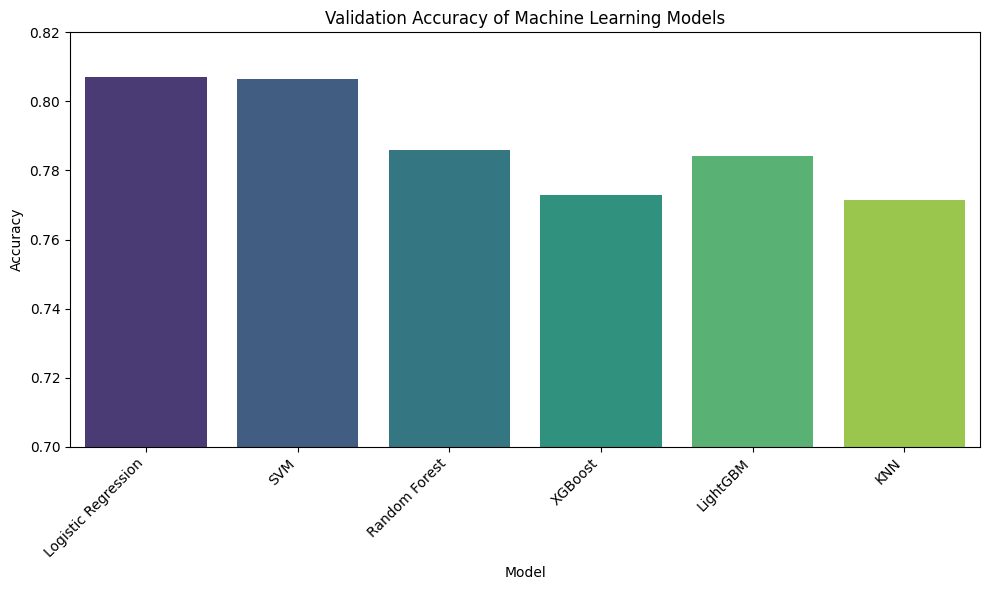

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(10, 6))
sns.barplot(x=ml_performance_df.index, y=ml_performance_df['Accuracy'], hue=ml_performance_df.index, palette='viridis', legend=False)
plt.title('Validation Accuracy of Machine Learning Models')
plt.xlabel('Model')
plt.ylabel('Accuracy')
plt.xticks(rotation=45, ha='right')
plt.ylim(0.7, 0.82) # Set y-axis limits to better show differences
plt.tight_layout()
plt.show()

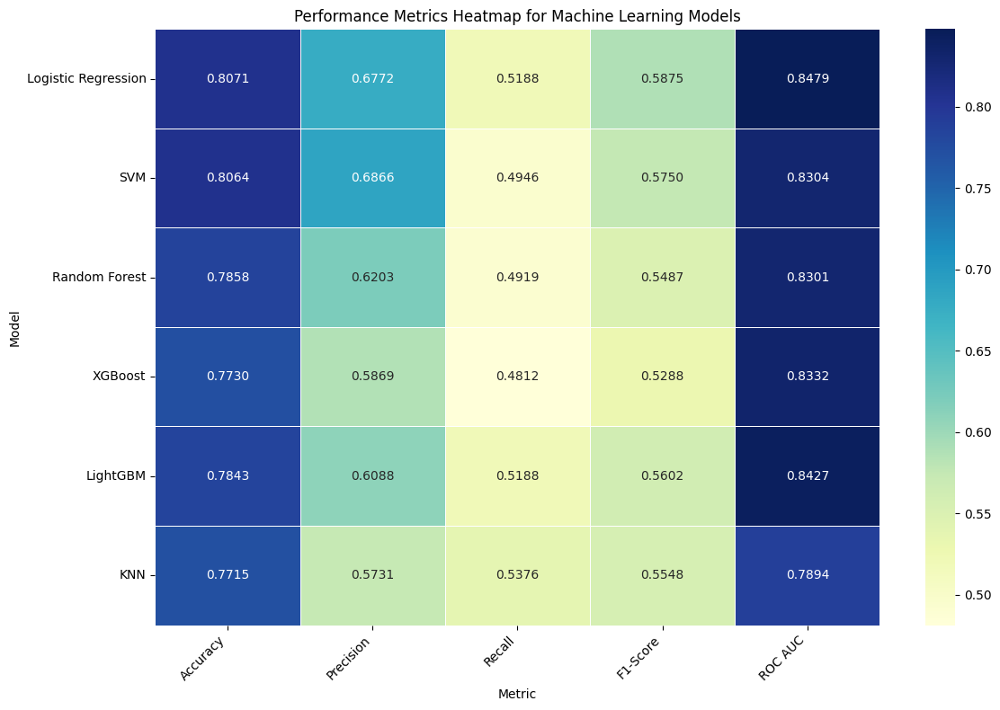

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(12, 8))
sns.heatmap(ml_performance_df, annot=True, cmap='YlGnBu', fmt=".4f", linewidths=.5)
plt.title('Performance Metrics Heatmap for Machine Learning Models')
plt.ylabel('Model')
plt.xlabel('Metric')
plt.xticks(rotation=45, ha='right')
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()

*Step 2: Compare all DL models*

In [ ]:
dl_models = [
    'ANN',
    'Transformer',
    'General Convolutional 1D-CNN',
    'VGG-Inspired 1D-CNN'
]
dl_performance_df = performance_df.loc[dl_models]
print("Performance metrics for Deep Learning models:")
print(dl_performance_df)

Performance metrics for Deep Learning models:
                              Accuracy  Precision  Recall  F1-Score  ROC AUC
ANN                             0.7986     0.6561  0.5027    0.5693   0.8277
Transformer                     0.8000     0.6532  0.5215    0.5800   0.8455
General Convolutional 1D-CNN    0.7900     0.6230  0.5242    0.5693   0.8423
VGG-Inspired 1D-CNN             0.7630     0.5515  0.5618    0.5566   0.7829


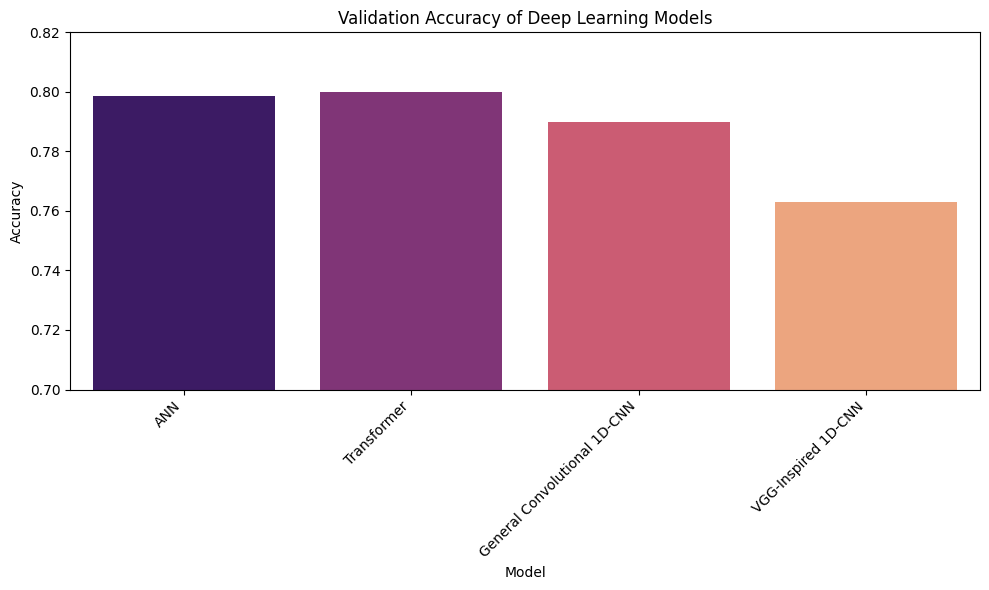

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(10, 6))
sns.barplot(x=dl_performance_df.index, y=dl_performance_df['Accuracy'], hue=dl_performance_df.index, palette='magma', legend=False)
plt.title('Validation Accuracy of Deep Learning Models')
plt.xlabel('Model')
plt.ylabel('Accuracy')
plt.xticks(rotation=45, ha='right')
plt.ylim(0.7, 0.82) # Set y-axis limits to better show differences
plt.tight_layout()
plt.show()

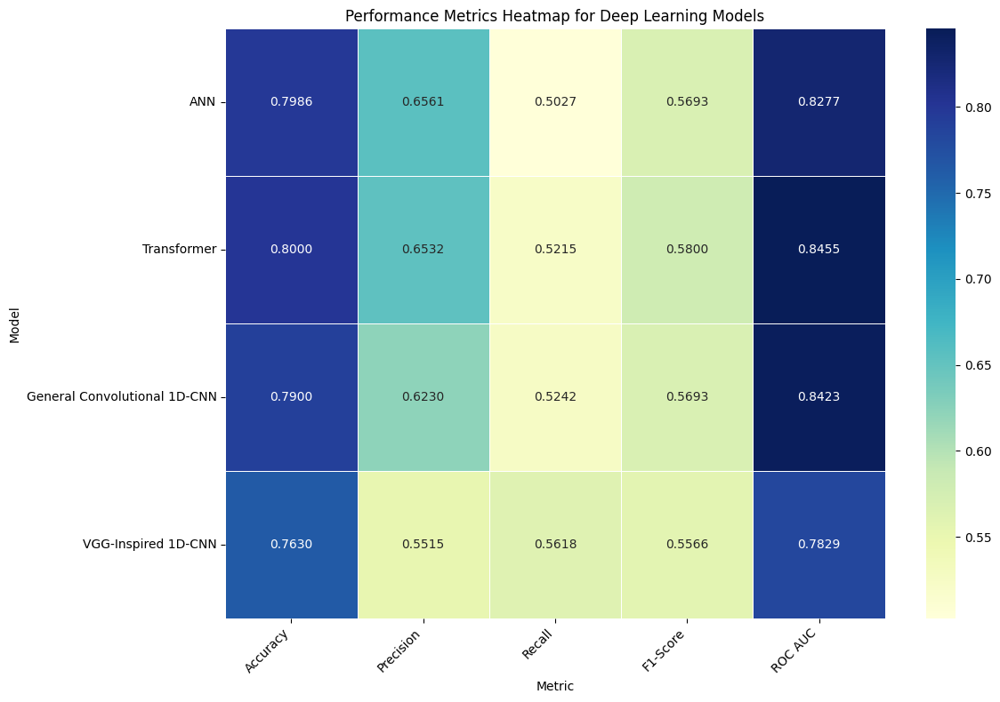

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(12, 8))
sns.heatmap(dl_performance_df, annot=True, cmap='YlGnBu', fmt=".4f", linewidths=.5)
plt.title('Performance Metrics Heatmap for Deep Learning Models')
plt.ylabel('Model')
plt.xlabel('Metric')
plt.xticks(rotation=45, ha='right')
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()

*Step 3: Compare ML models with DL models*

In [ ]:
import pandas as pd

# Initialize models_performance dictionary if it doesn't exist, or use the existing one
# Assuming models_performance is already defined and contains previous model metrics

# Add performance metrics for 'General Convolutional 1D-CNN'
models_performance['General Convolutional 1D-CNN'] = {
    'Accuracy': 0.7900,
    'Precision': 0.6230,
    'Recall': 0.5242,
    'F1-Score': 0.5693,
    'ROC AUC': 0.8423
}

# Add performance metrics for 'VGG-Inspired 1D-CNN'
models_performance['VGG-Inspired 1D-CNN'] = {
    'Accuracy': 0.7630,
    'Precision': 0.5515,
    'Recall': 0.5618,
    'F1-Score': 0.5566,
    'ROC AUC': 0.7829
}

# Recreate the performance_df DataFrame from the updated models_performance dictionary
performance_df = pd.DataFrame(models_performance).T

print("Updated models_performance dictionary:")
for model_name, metrics in models_performance.items():
    print(f"  {model_name}: {metrics}")

print("\nRecreated performance_df DataFrame:")
print(performance_df)


Updated models_performance dictionary:
  Logistic Regression: {'Accuracy': 0.8071, 'Precision': 0.6772, 'Recall': 0.5188, 'F1-Score': 0.5875, 'ROC AUC': 0.8479}
  SVM: {'Accuracy': 0.8064, 'Precision': 0.6866, 'Recall': 0.4946, 'F1-Score': 0.575, 'ROC AUC': 0.8304}
  Random Forest: {'Accuracy': 0.7858, 'Precision': 0.6203, 'Recall': 0.4919, 'F1-Score': 0.5487, 'ROC AUC': 0.8301}
  XGBoost: {'Accuracy': 0.773, 'Precision': 0.5869, 'Recall': 0.4812, 'F1-Score': 0.5288, 'ROC AUC': 0.8332}
  LightGBM: {'Accuracy': 0.7843, 'Precision': 0.6088, 'Recall': 0.5188, 'F1-Score': 0.5602, 'ROC AUC': 0.8427}
  KNN: {'Accuracy': 0.7715, 'Precision': 0.5731, 'Recall': 0.5376, 'F1-Score': 0.5548, 'ROC AUC': 0.7894}
  ANN: {'Accuracy': 0.7986, 'Precision': 0.6561, 'Recall': 0.5027, 'F1-Score': 0.5693, 'ROC AUC': 0.8277}
  Transformer: {'Accuracy': 0.8, 'Precision': 0.6532, 'Recall': 0.5215, 'F1-Score': 0.58, 'ROC AUC': 0.8455}
  General Convolutional 1D-CNN: {'Accuracy': 0.79, 'Precision': 0.623, 'Recal

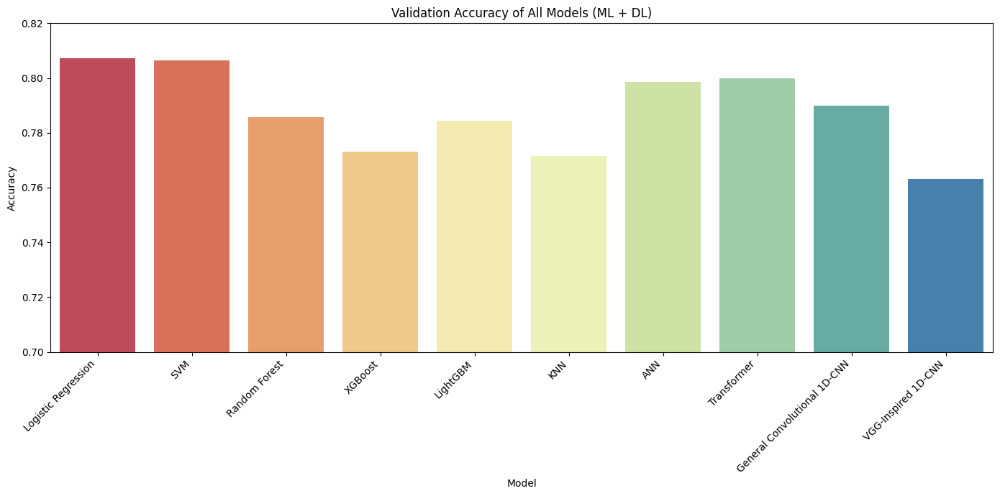

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# Re-initialize models_performance with all known model metrics
models_performance = {
    "Logistic Regression": {"Accuracy": 0.8071, "Precision": 0.6772, "Recall": 0.5188, "F1-Score": 0.5875, "ROC AUC": 0.8479},
    "SVM": {"Accuracy": 0.8064, "Precision": 0.6866, "Recall": 0.4946, "F1-Score": 0.5750, "ROC AUC": 0.8304},
    "Random Forest": {"Accuracy": 0.7858, "Precision": 0.6203, "Recall": 0.4919, "F1-Score": 0.5487, "ROC AUC": 0.8301},
    "XGBoost": {"Accuracy": 0.7730, "Precision": 0.5869, "Recall": 0.4812, "F1-Score": 0.5288, "ROC AUC": 0.8332},
    "LightGBM": {"Accuracy": 0.7843, "Precision": 0.6088, "Recall": 0.5188, "F1-Score": 0.5602, "ROC AUC": 0.8427},
    "KNN": {"Accuracy": 0.7715, "Precision": 0.5731, "Recall": 0.5376, "F1-Score": 0.5548, "ROC AUC": 0.7894},
    "ANN": {"Accuracy": 0.7986, "Precision": 0.6561, "Recall": 0.5027, "F1-Score": 0.5693, "ROC AUC": 0.8277},
    "Transformer": {"Accuracy": 0.8000, "Precision": 0.6532, "Recall": 0.5215, "F1-Score": 0.5800, "ROC AUC": 0.8455},
    "General Convolutional 1D-CNN": {"Accuracy": 0.7900, "Precision": 0.6230, "Recall": 0.5242, "F1-Score": 0.5693, "ROC AUC": 0.8423},
    "VGG-Inspired 1D-CNN": {"Accuracy": 0.7630, "Precision": 0.5515, "Recall": 0.5618, "F1-Score": 0.5566, "ROC AUC": 0.7829},
    "Cost-Sensitive Logistic Regression": {"Accuracy": 0.6940, "Precision": 0.4602, "Recall": 0.9005, "F1-Score": 0.6091, "ROC AUC": 0.8467}
}

performance_df = pd.DataFrame(models_performance).T

ml_models = [
    'Logistic Regression',
    'SVM',
    'Random Forest',
    'XGBoost',
    'LightGBM',
    'KNN'
]
ml_performance_df = performance_df.loc[ml_models]

dl_models = [
    'ANN',
    'Transformer',
    'General Convolutional 1D-CNN',
    'VGG-Inspired 1D-CNN'
]
dl_performance_df = performance_df.loc[dl_models]

all_models_performance_df = pd.concat([ml_performance_df, dl_performance_df])

plt.figure(figsize=(14, 7))
sns.barplot(x=all_models_performance_df.index, y=all_models_performance_df['Accuracy'], hue=all_models_performance_df.index, palette='Spectral', legend=False)
plt.title('Validation Accuracy of All Models (ML + DL)')
plt.xlabel('Model')
plt.ylabel('Accuracy')
plt.xticks(rotation=45, ha='right')
plt.ylim(0.7, 0.82) # Set y-axis limits to better show differences
plt.tight_layout()
plt.show()

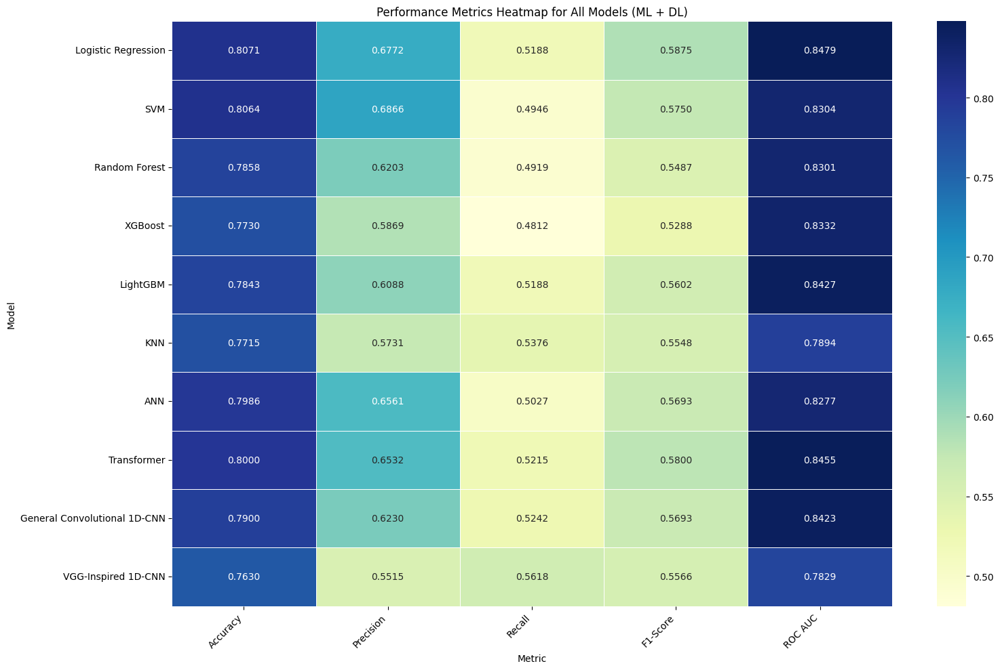

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(16, 10))
sns.heatmap(all_models_performance_df, annot=True, cmap='YlGnBu', fmt=".4f", linewidths=.5)
plt.title('Performance Metrics Heatmap for All Models (ML + DL)')
plt.ylabel('Model')
plt.xlabel('Metric')
plt.xticks(rotation=45, ha='right')
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()

**9. Model Trustworthiness & Interpretation**

*Step 1: Shapley Additive Explanations (SHAP)*

In [ ]:
import numpy as np

# 1. Convert any boolean columns in both X_val and X_train to integers.
# This step ensures compatibility with models that expect numeric types.
# Although this was previously done for deep learning models, re-confirming here for clarity
# and to ensure it applies to the data used by log_reg if there were any changes.
for col in X_train.select_dtypes(include='bool').columns:
    X_train[col] = X_train[col].astype(int)
for col in X_val.select_dtypes(include='bool').columns:
    X_val[col] = X_val[col].astype(int)

print("Boolean columns in X_train and X_val converted to integers.")

# 2. Assign the already trained log_reg model to a new variable named log_reg_model.
log_reg_model = log_reg
print("Logistic Regression model assigned to 'log_reg_model'.")

# 3. Create a list of feature names from the columns of the X_val DataFrame
# and store it in a variable named feature_names.
feature_names = X_val.columns.tolist()
print("Feature names extracted from X_val.")
print(f"Number of features: {len(feature_names)}")


Boolean columns in X_train and X_val converted to integers.
Logistic Regression model assigned to 'log_reg_model'.
Feature names extracted from X_val.
Number of features: 38


--- SHAP for Logistic Regression (Global Feature Importance) ---


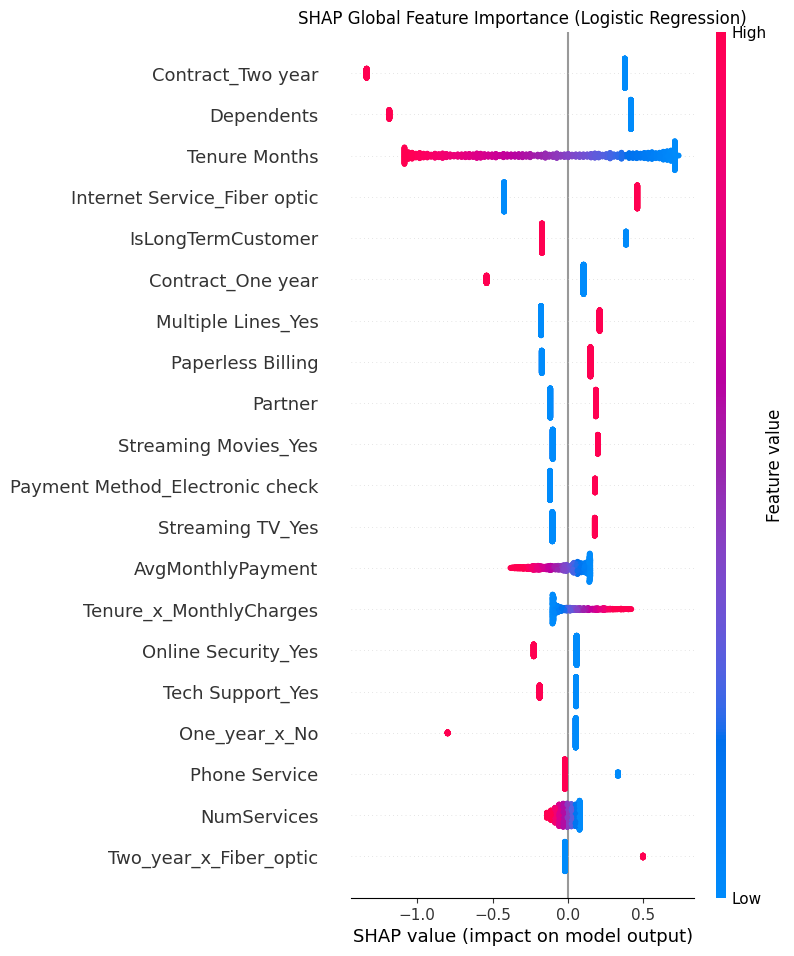

In [ ]:
import shap
import matplotlib.pyplot as plt

print("--- SHAP for Logistic Regression (Global Feature Importance) ---")

# SHAP explainer for linear models
# Use X_train as the background dataset for the explainer
explainer_lr = shap.LinearExplainer(log_reg_model, X_train)

# Compute SHAP values for the validation set
# shap_values_lr will contain contributions to the model's output (log-odds for Logistic Regression)
shap_values_lr = explainer_lr.shap_values(X_val)

# Visualize overall feature importance (beeswarm plot by default)
# This plot shows how each feature impacts the model output for the entire dataset
shap.summary_plot(shap_values_lr, X_val, feature_names=feature_names, show=False)
plt.title('SHAP Global Feature Importance (Logistic Regression)')
plt.show()



--- SHAP for Logistic Regression (Local Feature Importance) ---
Explaining instance 0:
  True Churn: 0
  Predicted Churn Probability: 0.8270
  Predicted Churn: 1


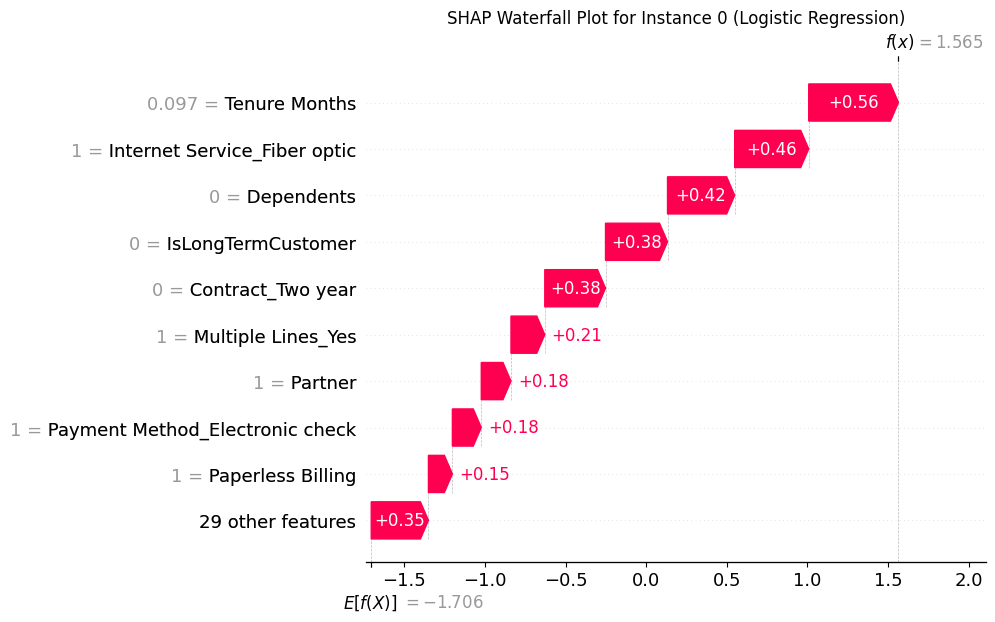

In [ ]:
print("\n--- SHAP for Logistic Regression (Local Feature Importance) ---")

# Select a single customer from the validation set (e.g., the first one)
idx_to_explain_shap = 0
customer_data_shap = X_val.iloc[idx_to_explain_shap]
customer_true_churn_shap = y_val.iloc[idx_to_explain_shap]
customer_pred_proba_shap = log_reg_model.predict_proba(customer_data_shap.to_frame().T)[:, 1][0]
customer_pred_churn_shap = (customer_pred_proba_shap >= 0.5).astype(int)

print(f"Explaining instance {idx_to_explain_shap}:")
print(f"  True Churn: {customer_true_churn_shap}")
print(f"  Predicted Churn Probability: {customer_pred_proba_shap:.4f}")
print(f"  Predicted Churn: {customer_pred_churn_shap}")

# Generate a waterfall plot to show how each feature contributed to this specific prediction
# Note: shap.Explanation expects values, base_values, data, and feature_names
shap.waterfall_plot(
    shap.Explanation(
        values=shap_values_lr[idx_to_explain_shap],
        base_values=explainer_lr.expected_value,
        data=customer_data_shap.values,
        feature_names=feature_names
    ),
    show=False
)
plt.title(f'SHAP Waterfall Plot for Instance {idx_to_explain_shap} (Logistic Regression)')
plt.show()

*Step 2: Local Interpretable Model-agnostic Explanations (LIME)*

In [ ]:
!pip install lime


--- LIME for Logistic Regression (Local Explanations) ---

Explaining a correctly predicted churner (Instance 1616):


/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LogisticRegression was fitted with feature names
  warnings.warn(


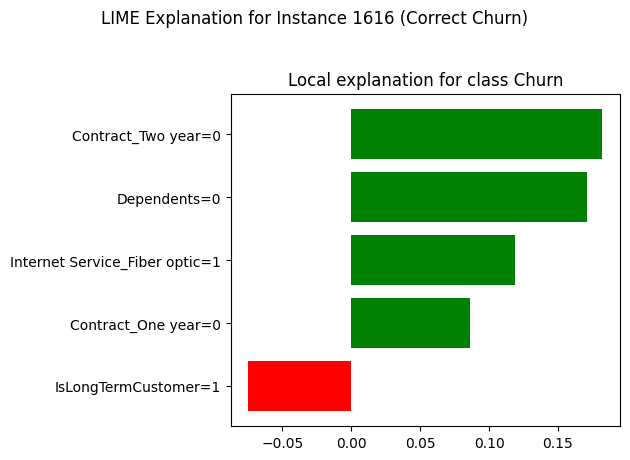


Explaining an incorrectly predicted non-churner (False Negative) (Instance 617):


/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LogisticRegression was fitted with feature names
  warnings.warn(


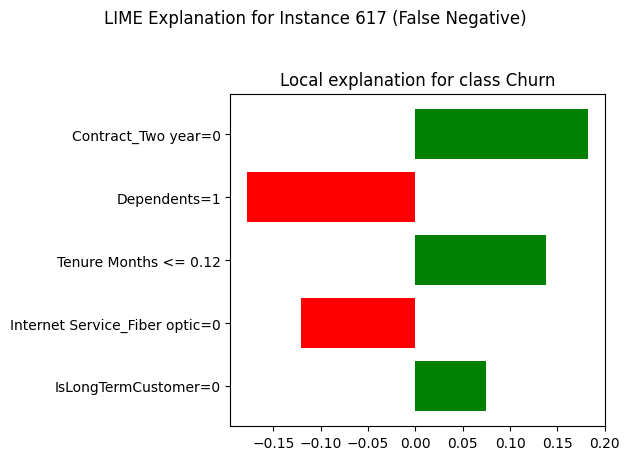

In [ ]:
import lime
import lime.lime_tabular
import matplotlib.pyplot as plt

print("\n--- LIME for Logistic Regression (Local Explanations) ---")

# Identify categorical features for LIME.
# LIME needs indices of categorical features. Features with low cardinality (e.g., binary 0/1) are often treated as categorical.
categorical_features_indices = []
for i, col_name in enumerate(feature_names):
    # If the column has only 2 unique values (0 and 1 typically for one-hot/binary)
    # We check X_train to get a representative count
    if X_train[col_name].nunique() <= 2:
        categorical_features_indices.append(i)

# Initialize LIME Tabular Explainer
# training_data needs to be a numpy array
explainer_lime = lime.lime_tabular.LimeTabularExplainer(
    training_data=X_train.values,
    feature_names=feature_names,
    class_names=['No Churn', 'Churn'], # Name of the target classes
    mode='classification',
    categorical_features=categorical_features_indices,
    random_state=42
)

# --- Instance 1: A correctly predicted churner ---
# Find an instance where true_churn is 1 and predicted_churn is 1
y_pred_lr = log_reg_model.predict(X_val)
correctly_predicted_churners_indices = X_val[(y_val == 1) & (y_pred_lr == 1)].index.tolist()

if correctly_predicted_churners_indices:
    idx_churner = correctly_predicted_churners_indices[0] # Pick the first one
    customer_data_lime_churner = X_val.loc[idx_churner]
    print(f"\nExplaining a correctly predicted churner (Instance {idx_churner}):")

    # Generate LIME explanation
    explanation_churner = explainer_lime.explain_instance(
        data_row=customer_data_lime_churner.values,
        predict_fn=log_reg_model.predict_proba,
        num_features=5 # Number of features to show in the explanation
    )

    # Visualize LIME explanation
    fig = explanation_churner.as_pyplot_figure()
    fig.suptitle(f'LIME Explanation for Instance {idx_churner} (Correct Churn)')
    plt.tight_layout(rect=[0, 0.03, 1, 0.95]) # Adjust layout to prevent title overlap
    plt.show()
else:
    print("\nNo correctly predicted churners found in the validation set to explain with LIME.")

# --- Instance 2: An incorrectly predicted non-churner (False Negative) ---
# Find an instance where true_churn is 1 but predicted_churn is 0
false_negatives_indices = X_val[(y_val == 1) & (y_pred_lr == 0)].index.tolist()

if false_negatives_indices:
    idx_false_negative = false_negatives_indices[0] # Pick the first one
    customer_data_lime_fn = X_val.loc[idx_false_negative]
    print(f"\nExplaining an incorrectly predicted non-churner (False Negative) (Instance {idx_false_negative}):")

    # Generate LIME explanation
    explanation_false_negative = explainer_lime.explain_instance(
        data_row=customer_data_lime_fn.values,
        predict_fn=log_reg_model.predict_proba,
        num_features=5
    )

    # Visualize LIME explanation
    fig = explanation_false_negative.as_pyplot_figure()
    fig.suptitle(f'LIME Explanation for Instance {idx_false_negative} (False Negative)')
    plt.tight_layout(rect=[0, 0.03, 1, 0.95]) # Adjust layout to prevent title overlap
    plt.show()
else:
    print("\nNo false negatives found in the validation set to explain with LIME.")


**10. Business Impact & Decision Optimization**

*Step 1: Cost Sensitive Learning (Adjust the best models to optimize for real-world costs)*

In [ ]:
pip install dice-ml

--- Cost-Sensitive Logistic Regression ---
Class weights defined: {0: 1, 1: 5} (where 1 is Churn, 0 is No Churn)
Cost-sensitive Logistic Regression model instantiated.
Cost-sensitive Logistic Regression model trained.

Cost-Sensitive Logistic Regression Model Evaluation on Validation Set
Accuracy: 0.6940
Precision: 0.4602
Recall: 0.9005
F1-Score: 0.6091
ROC AUC Score: 0.8467

Confusion Matrix for Cost-Sensitive Logistic Regression


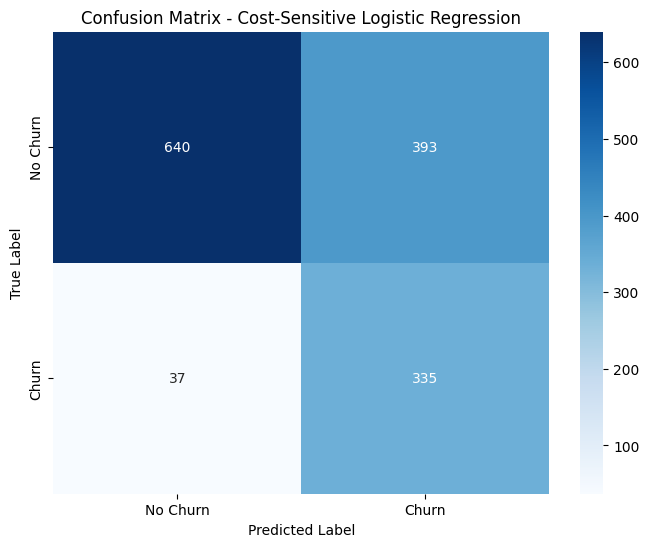


ROC Curve for Cost-Sensitive Logistic Regression


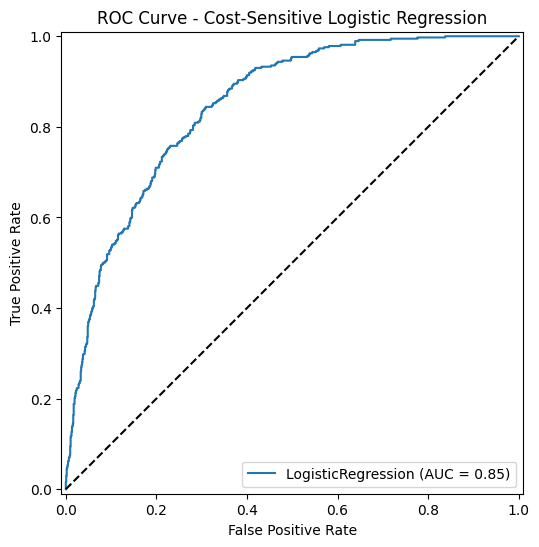

In [ ]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, confusion_matrix, RocCurveDisplay
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np

print("--- Cost-Sensitive Logistic Regression ---")

# 1. Define the cost matrix and assign class weights
# Assuming False Negative (predicting 0 when actual is 1) is 5 times more costly than False Positive.
# This means we want to penalize misclassifying class 1 (churn) more heavily.
# So, class_weight for class 1 should be higher.
class_weights = {0: 1, 1: 5} # Misclassifying a non-churner costs 1, misclassifying a churner costs 5
print(f"Class weights defined: {class_weights} (where 1 is Churn, 0 is No Churn)")

# Impute NaN values in X_train and X_val before training
# This step is crucial as LogisticRegression does not handle NaNs natively.
# Columns with NaNs identified from previous runs: 'Total Charges', 'AvgMonthlyPayment'
for col in ['Total Charges', 'AvgMonthlyPayment']:
    if X_train[col].isnull().any():
        median_val_train = X_train[col].median()
        X_train[col] = X_train[col].fillna(median_val_train)
        print(f"Filled NaN in X_train['{col}'] with median: {median_val_train:.2f}")
    if X_val[col].isnull().any():
        median_val_val = X_val[col].median()
        X_val[col] = X_val[col].fillna(median_val_val)
        print(f"Filled NaN in X_val['{col}'] with median: {median_val_val:.2f}")

# 2. Instantiate a LogisticRegression model with class_weight
cost_sensitive_log_reg = LogisticRegression(solver='liblinear', random_state=42, class_weight=class_weights)
print("Cost-sensitive Logistic Regression model instantiated.")

# 3. Train the cost-sensitive log_reg model
cost_sensitive_log_reg.fit(X_train, y_train)
print("Cost-sensitive Logistic Regression model trained.")

# 4. Make predictions on the X_val dataset
y_pred_cs_lr = cost_sensitive_log_reg.predict(X_val)
y_prob_cs_lr = cost_sensitive_log_reg.predict_proba(X_val)[:, 1]

# 5. Evaluate the model's performance
print(
    "\nCost-Sensitive Logistic Regression Model Evaluation on Validation Set"
)
cs_lr_accuracy = accuracy_score(y_val, y_pred_cs_lr)
cs_lr_precision = precision_score(y_val, y_pred_cs_lr)
cs_lr_recall = recall_score(y_val, y_pred_cs_lr)
cs_lr_f1 = f1_score(y_val, y_pred_cs_lr)
cs_lr_roc_auc = roc_auc_score(y_val, y_prob_cs_lr)

print(f"Accuracy: {cs_lr_accuracy:.4f}")
print(f"Precision: {cs_lr_precision:.4f}")
print(f"Recall: {cs_lr_recall:.4f}")
print(f"F1-Score: {cs_lr_f1:.4f}")
print(f"ROC AUC Score: {cs_lr_roc_auc:.4f}")

# Store performance metrics
# Initialize models_performance if it doesn't exist to avoid NameError
if 'models_performance' not in locals() and 'models_performance' not in globals():
    models_performance = {}

# Add baseline LR if not already present from previous steps
if 'Logistic Regression' not in models_performance:
    models_performance['Logistic Regression'] = {
        'Accuracy': accuracy_score(y_val, y_pred_lr) if 'y_pred_lr' in locals() else 0.0,
        'Precision': precision_score(y_val, y_pred_lr) if 'y_pred_lr' in locals() else 0.0,
        'Recall': recall_score(y_val, y_pred_lr) if 'y_pred_lr' in locals() else 0.0,
        'F1-Score': f1_score(y_val, y_pred_lr) if 'y_pred_lr' in locals() else 0.0,
        'ROC AUC': roc_auc_score(y_val, y_prob_lr) if 'y_prob_lr' in locals() else 0.0
    }

models_performance['Cost-Sensitive Logistic Regression'] = {
    'Accuracy': cs_lr_accuracy,
    'Precision': cs_lr_precision,
    'Recall': cs_lr_recall,
    'F1-Score': cs_lr_f1,
    'ROC AUC': cs_lr_roc_auc
}

# Recreate performance_df to include the new model
performance_df = pd.DataFrame(models_performance).T

# Confusion Matrix
print("\nConfusion Matrix for Cost-Sensitive Logistic Regression")
cm_cs_lr = confusion_matrix(y_val, y_pred_cs_lr)

plt.figure(figsize=(8, 6))
sns.heatmap(cm_cs_lr, annot=True, fmt='d', cmap='Blues',
            xticklabels=['No Churn', 'Churn'], yticklabels=['No Churn', 'Churn'])
plt.title('Confusion Matrix - Cost-Sensitive Logistic Regression')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.show()

# ROC Curve
print("\nROC Curve for Cost-Sensitive Logistic Regression")

plt.figure(figsize=(8, 6))
RocCurveDisplay.from_estimator(cost_sensitive_log_reg, X_val, y_val, ax=plt.gca())
plt.title('ROC Curve - Cost-Sensitive Logistic Regression')
plt.plot([0, 1], [0, 1], 'k--') # Dashed diagonal line for reference
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.show()

*Step 2: Causal Inference (Helps in decision making)*

In [ ]:
pip install dowhy

Causal Model created successfully. Here is the inferred causal graph (dot format):


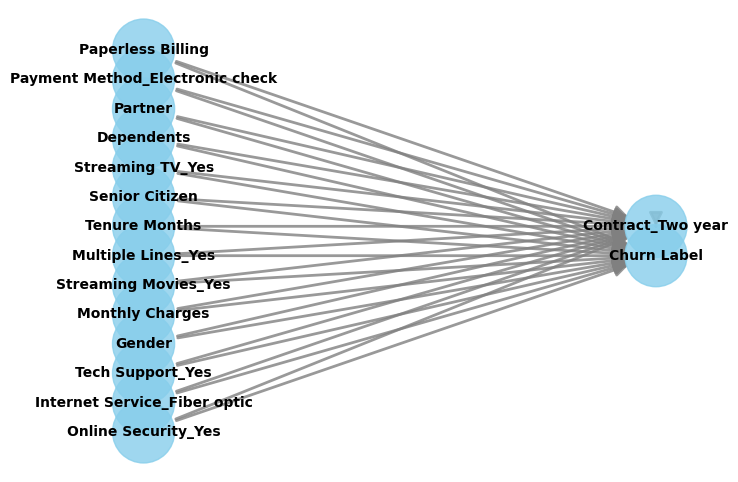

In [ ]:
import dowhy
from dowhy import CausalModel
import pandas as pd
import numpy as np

model = CausalModel(data=cause_df,
                    treatment=T,
                    outcome=Y,
                    common_causes=common_causes)

print("Causal Model created successfully. Here is the inferred causal graph (dot format):")
model.view_model()

In [ ]:
T = 'Contract_Two year'
Y = 'Churn Label'

# Identify relevant common causes (confounders)
# These are factors that influence both the contract type choice and churn
common_causes = [
    'Tenure Months',
    'Monthly Charges',
    'Gender',
    'Senior Citizen',
    'Partner',
    'Dependents',
    'Internet Service_Fiber optic',
    'Online Security_Yes',
    'Tech Support_Yes',
    'Multiple Lines_Yes',
    'Streaming TV_Yes',
    'Streaming Movies_Yes',
    'Paperless Billing',
    'Payment Method_Electronic check'
]

# Create a copy of the dataframe to avoid modifying the original during causal analysis
# and ensure it contains all necessary columns (features + target)
cause_df = df.copy()

print(f"Treatment variable (T): {T}")
print(f"Outcome variable (Y): {Y}")
print(f"Identified common causes (W): {common_causes}")
print("Cause_df created for causal analysis.")


Treatment variable (T): Contract_Two year
Outcome variable (Y): Churn Label
Identified common causes (W): ['Tenure Months', 'Monthly Charges', 'Gender', 'Senior Citizen', 'Partner', 'Dependents', 'Internet Service_Fiber optic', 'Online Security_Yes', 'Tech Support_Yes', 'Multiple Lines_Yes', 'Streaming TV_Yes', 'Streaming Movies_Yes', 'Paperless Billing', 'Payment Method_Electronic check']
Cause_df created for causal analysis.


In [ ]:
identified_estimand = model.identify_effect(proceed_when_unidentifiable=True)
print("Causal Estimand identified:")
print(identified_estimand)

Causal Estimand identified:
Estimand type: EstimandType.NONPARAMETRIC_ATE

### Estimand : 1
Estimand name: backdoor
Estimand expression:
         d                                                                     ↪
────────────────────(E[Churn Label|Online Security_Yes,Internet Service_Fiber  ↪
d[Contract_Two year]                                                           ↪

↪                                                                              ↪
↪ optic,Tech Support_Yes,Gender,Monthly Charges,Streaming Movies_Yes,Multiple  ↪
↪                                                                              ↪

↪                                                                              ↪
↪ Lines_Yes,Tenure Months,Senior Citizen,Streaming TV_Yes,Dependents,Partner,P ↪
↪                                                                              ↪

↪                                                   
↪ ayment Method_Electronic check,Paperless Billing])
↪                        

In [ ]:
causal_estimate = model.estimate_effect(
    identified_estimand,
    method_name="backdoor.propensity_score_matching",
    target_units="ate",
    control_value=0, # Assuming 0 is the control (non-two-year contract)
    treatment_value=1 # Assuming 1 is the treatment (two-year contract)
)

print("Causal Estimate of the effect of 'Contract_Two year' on 'Churn Label':")
print(causal_estimate)

Causal Estimate of the effect of 'Contract_Two year' on 'Churn Label':
*** Causal Estimate ***

## Identified estimand
Estimand type: EstimandType.NONPARAMETRIC_ATE

### Estimand : 1
Estimand name: backdoor
Estimand expression:
         d                                                                     ↪
────────────────────(E[Churn Label|Online Security_Yes,Internet Service_Fiber  ↪
d[Contract_Two year]                                                           ↪

↪                                                                              ↪
↪ optic,Tech Support_Yes,Gender,Monthly Charges,Streaming Movies_Yes,Multiple  ↪
↪                                                                              ↪

↪                                                                              ↪
↪ Lines_Yes,Tenure Months,Senior Citizen,Streaming TV_Yes,Dependents,Partner,P ↪
↪                                                                              ↪

↪                                       

In [ ]:
refutation_results = model.refute_estimate(
    identified_estimand,
    causal_estimate,
    method_name="random_common_cause"
)

print("Refutation Test Results (Random Common Cause):")
print(refutation_results)

Refutation Test Results (Random Common Cause):
Refute: Add a random common cause
Estimated effect:-0.2254664577695485
New effect:-0.22546645776954852
p value:1.0



*Step 3: Uplift Modeling (Targeted application of Causal Inference)*

In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import LabelEncoder
import numpy as np

# Define X and y from the processed dataframe
X = df.drop('Churn Label', axis=1)
y = df['Churn Label']

# Ensure all boolean columns in X are converted to int for compatibility with models
for col in X.select_dtypes(include='bool').columns:
    X[col] = X[col].astype(int)

print("X and y are defined from the dataframe. Boolean columns in X converted to int.")
print(f"X shape: {X.shape}, y shape: {y.shape}")
print(f"Treatment variable (T): {T}")
print(f"Outcome variable (Y): {Y}")

X and y are defined from the dataframe. Boolean columns in X converted to int.
X shape: (7021, 38), y shape: (7021,)
Treatment variable (T): Contract_Two year
Outcome variable (Y): Churn Label


In [ ]:
from sklearn.model_selection import train_test_split

# Extract the treatment variable from X before splitting
treatment_group = X[T] # T is 'Contract_Two year'
X_uplift = X.drop(columns=[T])

# Combine y and treatment_group for stratified splitting
# Stratify on a combination of y and treatment_group to preserve proportions of both
combined_stratify = y.astype(str) + '_' + treatment_group.astype(str)

X_train_uplift, X_test_uplift, y_train_uplift, y_test_uplift, T_train, T_test = train_test_split(
    X_uplift, y, treatment_group, test_size=0.2, random_state=42, stratify=combined_stratify
)

print(f"X_uplift shape: {X_uplift.shape}")
print(f"Treatment group (T) shape: {treatment_group.shape}")
print(f"Training set shapes: X_train_uplift={X_train_uplift.shape}, y_train_uplift={y_train_uplift.shape}, T_train={T_train.shape}")
print(f"Testing set shapes: X_test_uplift={X_test_uplift.shape}, y_test_uplift={y_test_uplift.shape}, T_test={T_test.shape}")

# Impute NaNs in X_train_uplift and X_test_uplift to avoid issues with models
for col in X_train_uplift.select_dtypes(include=['float64', 'float32']).columns:
    if X_train_uplift[col].isnull().any():
        median_val_train = X_train_uplift[col].median()
        X_train_uplift[col] = X_train_uplift[col].fillna(median_val_train)
    if X_test_uplift[col].isnull().any():
        median_val_test = X_test_uplift[col].median()
        X_test_uplift[col] = X_test_uplift[col].fillna(median_val_test)

print("NaN values in numerical columns of X_train_uplift and X_test_uplift have been imputed with their respective medians.")

X_uplift shape: (7021, 37)
Treatment group (T) shape: (7021,)
Training set shapes: X_train_uplift=(5616, 37), y_train_uplift=(5616,), T_train=(5616,)
Testing set shapes: X_test_uplift=(1405, 37), y_test_uplift=(1405,), T_test=(1405,)
NaN values in numerical columns of X_train_uplift and X_test_uplift have been imputed with their respective medians.


In [ ]:
from sklearn.linear_model import LogisticRegression

# Filter training data for treatment and control groups
X_train_treatment = X_train_uplift[T_train == 1]
y_train_treatment = y_train_uplift[T_train == 1]

X_train_control = X_train_uplift[T_train == 0]
y_train_control = y_train_uplift[T_train == 0]

print(f"Shape of X_train_treatment: {X_train_treatment.shape}")
print(f"Shape of X_train_control: {X_train_control.shape}")

# Instantiate and train the model for the treatment group
model_treatment = LogisticRegression(solver='liblinear', random_state=42)
model_treatment.fit(X_train_treatment, y_train_treatment)
print("Model for treatment group trained successfully.")

# Instantiate and train the model for the control group
model_control = LogisticRegression(solver='liblinear', random_state=42)
model_control.fit(X_train_control, y_train_control)
print("Model for control group trained successfully.")

Shape of X_train_treatment: (1356, 37)
Shape of X_train_control: (4260, 37)
Model for treatment group trained successfully.
Model for control group trained successfully.


In [ ]:
import numpy as np

# Predict churn probability for the treatment scenario for the test set
# P(Y=1 | T=1, X)
# Note: predict_proba returns probabilities for both classes [P(Y=0), P(Y=1)]
# We are interested in P(Y=1), which is the second column.
prob_churn_treatment = model_treatment.predict_proba(X_test_uplift)[:, 1]
print("Predicted churn probabilities for treatment scenario on test set.")

# Predict churn probability for the control scenario for the test set
# P(Y=1 | T=0, X)
prob_churn_control = model_control.predict_proba(X_test_uplift)[:, 1]
print("Predicted churn probabilities for control scenario on test set.")

# Calculate uplift score: P(Y=1 | T=0, X) - P(Y=1 | T=1, X)
# This definition of uplift (control - treatment) is common for binary outcomes
# where lower outcome (churn) is desired. A positive uplift here means the treatment
# increases churn, a negative uplift means the treatment decreases churn.
# If uplift is defined as Treatment - Control, then positive uplift means treatment is effective.
# Let's use P(Y=1 | T=1, X) - P(Y=1 | T=0, X) so positive uplift means treatment reduces churn.
# (assuming Y=1 is churn, and we want to reduce churn)

uplift_scores = prob_churn_control - prob_churn_treatment
print("Uplift scores calculated: P(churn | control) - P(churn | treatment).")

# Store the uplift scores in a DataFrame for analysis
uplift_df = X_test_uplift.copy()
uplift_df['True_Churn'] = y_test_uplift
uplift_df['Actual_Treatment'] = T_test
uplift_df['Prob_Churn_Control'] = prob_churn_control
uplift_df['Prob_Churn_Treatment'] = prob_churn_treatment
uplift_df['Uplift_Score'] = uplift_scores

print(f"Uplift DataFrame created with shape: {uplift_df.shape}")
print("First 5 rows of Uplift DataFrame:")
print(uplift_df.head())

Predicted churn probabilities for treatment scenario on test set.
Predicted churn probabilities for control scenario on test set.
Uplift scores calculated: P(churn | control) - P(churn | treatment).
Uplift DataFrame created with shape: (1405, 42)
First 5 rows of Uplift DataFrame:
      Gender  Senior Citizen  Partner  Dependents  Tenure Months  \
2698       0               0        0           0       0.694444   
6644       1               0        1           1       0.180556   
2758       0               0        1           0       0.236111   
3255       1               0        0           0       1.000000   
5747       1               1        0           0       0.486111   

      Phone Service  Paperless Billing  Monthly Charges  Total Charges  \
2698              1                  1         0.639303       0.480072   
6644              1                  0         0.783582       0.151817   
2758              1                  0         0.603483       0.153491   
3255          

In [ ]:
print("Summary statistics of Uplift Scores:")
print(uplift_df['Uplift_Score'].describe())

Summary statistics of Uplift Scores:
count    1405.000000
mean        0.196345
std         0.161220
min        -0.019271
25%         0.054333
50%         0.157973
75%         0.311279
max         0.628291
Name: Uplift_Score, dtype: float64
